# MAUR annotation assessment ipynb

In [3]:
# Load autoreload magic
%load_ext autoreload
%autoreload 2

import importlib
import sys, os
sys.path.append(r'/Users/dvan216/Documents/Inkfish-Phd/substrata_local/src')
from substrata import *
import open3d as o3d
import geopandas as gpd
from shapely.ops import transform
from shapely.geometry import box
import numpy as np

/Users/dvan216/miniconda3/envs/unicorn_env/lib/python3.10/site-packages/tqdm_joblib/__init__.py:4: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm


In [4]:
import numpy as np
import open3d as o3d
from shapely.geometry import Polygon
from shapely.ops import unary_union
def apply_transform(points, T):
    """
    points: (N, 3) array
    T: (4, 4) transformation matrix
    """
    points = np.asarray(points)

    # Add homogeneous coordinate
    ones = np.ones((points.shape[0], 1))
    points_h = np.hstack([points, ones])   # (N,4)

    # Apply transform
    points_t = (T @ points_h.T).T         # (N,4)

    return points_t[:, :3]   

def apply_matrix_to_geom(geom, T):
    def f(x, y, z=None):
        pts = np.vstack([x, y, np.zeros_like(x) if z is None else z, np.ones_like(x)])
        pts_t = T @ pts
        return pts_t[0], pts_t[1], pts_t[2] if z is not None else None
    return transform(f, geom)

def align_polygon(x, y, matrix, z=None):
    x = np.asarray(x)
    y = np.asarray(y)

    if z is None:
        z = np.zeros_like(x)
    else:
        z = np.asarray(z)

    ones = np.ones_like(x)

    pts = np.vstack([x, y, z, ones])
    pts_t = matrix @ pts

    return pts_t[0], pts_t[1]             

def apply_matrix_to_box(geom, T):

    def f(x, y, z=None):
        x = np.asarray(x)
        y = np.asarray(y)

        if z is None:
            z = np.zeros_like(x)

        ones = np.ones_like(x)

        pts = np.vstack([x, y, z, ones])
        pts_t = T @ pts

        return pts_t[0], pts_t[1]

    return transform(f, geom)

import numpy as np
import pwlf

def divide_reef_zones(pcd, num_segments=3, vis=False):
    pts = pcd.points

    # Optionally check validity
    if num_segments < 1:
        raise ValueError("num_zones must be >= 1")
    
    # axis
    y_vals = pts[:, 1]
    z_vals = pts[:, 2]

    # binning
    bins = np.linspace(y_vals.min(), y_vals.max(), 200)
    digitized = np.digitize(y_vals, bins)

    z_profile = np.array([
        z_vals[digitized == i].mean() if np.any(digitized == i) else np.nan
        for i in range(1, len(bins))
    ])
    y_profile = (bins[:-1] + bins[1:]) / 2

    mask = ~np.isnan(z_profile)
    y_profile = y_profile[mask]
    z_profile = z_profile[mask]

    num_bkpts = num_segments + 1

    my_pwlf = pwlf.PiecewiseLinFit(y_profile, z_profile)
    breaks = my_pwlf.fit(num_bkpts)

    internal_breaks = breaks[1:-1]  

    # Get depths at each breakpoint
    break_depths = []
    for b in internal_breaks:
        idx = np.argmin(np.abs(y_profile - b))
        break_depths.append(z_profile[idx])

    if vis:
        import matplotlib.pyplot as plt

        plt.figure(figsize=(10,5))
        plt.scatter(y_vals, z_vals, s=1, alpha=0.3, label='Points')
        plt.plot(y_profile, z_profile, 'b-', label='Mean Z profile')
        plt.plot(breaks, my_pwlf.predict(breaks), 'r--', label='Piecewise fit')

        # plot all boundaries
        for i, d in enumerate(break_depths):
            plt.axhline(d, linestyle=":", label=f'Boundary {i+1}: {d:.2f} m')

        plt.xlabel('Y (along-reef)')
        plt.ylabel('Z (depth)')
        plt.title(f'Reef Z Profile with {num_segments} segments')
        plt.legend(loc="lower right", fontsize=9)
        plt.grid()
        plt.show()

    # return depths sorted shallow→deep
    return np.array(break_depths)

def get_pcd_segments_by_depth(pcd, breaks):
    """
    Segment point cloud into multiple clouds based on depth breaks.

    Parameters
    ----------
    pcd : PointCloud
        Input point cloud.
    breaks : list or array
        Depth breakpoints (z-values) defining segments.

    Returns
    -------
    segments : list of PointCloud
        List of segmented point clouds.
    """
    points = np.asarray(pcd.points)
    normals = np.asarray(pcd.normals)
    colors = np.asarray(pcd.colors)

    segments = []
    lower_bound = -np.inf

    for upper_bound in breaks:
        mask = (points[:, 2] >= lower_bound) & (points[:, 2] < upper_bound)
        segment_pcd = PointCloud()
        segment_pcd.populate_point_cloud(
            points[mask],
            normals[mask],
            colors[mask]
        )
        segments.append(segment_pcd)
        lower_bound = upper_bound

    # Last segment (above last break)
    mask = points[:, 2] >= lower_bound
    segment_pcd = PointCloud()
    segment_pcd.populate_point_cloud(
        points[mask],
        normals[mask],
        colors[mask]
    )
    segments.append(segment_pcd)

    return segments

def filter_mesh_by_z(mesh, z_min, z_max):
    vertices = np.asarray(mesh.vertices)
    triangles = np.asarray(mesh.triangles)
    # Get mask for triangles where all vertices fall within z-range
    mask = np.all((vertices[triangles][:,:,2] >= z_min) & (vertices[triangles][:,:,2] < z_max), axis=1)
    new_mesh = o3d.geometry.TriangleMesh()
    new_mesh.vertices = o3d.utility.Vector3dVector(vertices)
    new_mesh.triangles = o3d.utility.Vector3iVector(triangles[mask])
    return new_mesh

def filter_mesh_by_box(mesh, xmin, xmax, ymin, ymax):
    vertices = np.asarray(mesh.vertices)
    triangles = np.asarray(mesh.triangles)

    # Boolean mask per vertex (inside box)
    vmask = (
        (vertices[:, 0] >= xmin) & (vertices[:, 0] <= xmax) &
        (vertices[:, 1] >= ymin) & (vertices[:, 1] <= ymax)
    )

    # Keep triangles where ALL 3 vertices are inside
    tri_mask = np.all(vmask[triangles], axis=1)

    new_mesh = o3d.geometry.TriangleMesh()
    new_mesh.vertices = o3d.utility.Vector3dVector(vertices)
    new_mesh.triangles = o3d.utility.Vector3iVector(triangles[tri_mask])

    return new_mesh

def get_2D_footprint_area_PCA(mesh, vis=False):
    verts = np.asarray(mesh.vertices)
    triangles = np.asarray(mesh.triangles)  # <-- add this

    # --- PCA plane ---
    mean = verts.mean(axis=0)
    cov = np.cov((verts - mean).T)
    eigvals, eigvecs = np.linalg.eigh(cov)

    normal = eigvecs[:, np.argmin(eigvals)]

    temp = np.array([0, 0, 1])
    if abs(np.dot(normal, temp)) > 0.9:
        temp = np.array([1, 0, 0])

    u = np.cross(normal, temp)
    u /= np.linalg.norm(u)
    v = np.cross(normal, u)
    v /= np.linalg.norm(v)

    pts2d = np.column_stack([
        (verts - mean).dot(u),
        (verts - mean).dot(v)
    ])

    flat_mesh = o3d.geometry.TriangleMesh()
    flat_mesh.vertices = o3d.utility.Vector3dVector(
        np.column_stack([pts2d, np.zeros(pts2d.shape[0])])
    )
    flat_mesh.triangles = o3d.utility.Vector3iVector(triangles)

    if vis:
        return flat_mesh.get_surface_area(), flat_mesh
    else:
        return flat_mesh.get_surface_area()


def get_planar_footprint_area_union(mesh, vis=False):
    vertices = np.asarray(mesh.vertices)
    triangles = np.asarray(mesh.triangles)

    polys = []

    for tri in triangles:
        pts3d = vertices[tri]

        # Project to XY plane (drop Z)
        pts2d = pts3d[:, :2]

        # Skip degenerate triangles
        if np.linalg.matrix_rank(pts2d - pts2d[0]) < 2:
            continue

        poly = Polygon(pts2d)

        if poly.is_valid and poly.area > 0:
            polys.append(poly)

    if len(polys) == 0:
        return 0

    # Merge overlapping polygons (removes double counting)
    union_poly = unary_union(polys)

    area = union_poly.area

    if vis:
        return area, union_poly
    else:
        return area
    


## Kalki

In [40]:
#decimate_ply_file("/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/plys/cur_sna_lar_01122023_v2_woclass.ply", "/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/plys/cur_sna_lar_01122023_v2_woclass_dec.ply", 10000000)
kal_23_pcd = PointCloud('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/plys/cur_kal_med_2023_dec_cropped.ply')
kal_21_pcd = PointCloud('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/plys/cur_kal_med_2021_dec.ply')
kalki_scale = np.array([[43.1585,60.2622,-24.2375], [43.551, 61.5693, -24.5163], [26.0247, 65.692, -20.4259], [24.8062, 66.3257, -20.6435]])


RPly: Error reading 'x' of 'vertex' number 49999962


[Open3D WARNING] Read PLY failed: unable to read file: /Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/plys/cur_kal_med_2021_dec.ply


In [41]:
scale_1 = np.linalg.norm(kalki_scale[1] - kalki_scale[0])
scale_2 = np.linalg.norm(kalki_scale[2] - kalki_scale[3])

print("Scale 1 distance:", scale_1)
print("Scale 2 distance:", scale_2)

Scale 1 distance: 1.3929451173682328
Scale 2 distance: 1.3905638065187815


In [42]:
#kalki world transform
kal_align = Transform([
    [-1.8237988753862913, -0.28294908144565595, 0.13144205136735235, 7.773354055324771],
    [0.24818049713986484, -1.78813593044493, -0.40565486378341886, 22.205015657216954],
    [0.18905987516624223, -0.38221622804457617, 1.8004851157505164, 2.620590131304348],
    [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00],  
])


kal_23_pcd.apply_transform(kal_align)
print(kal_23_pcd.world_transform)

#visualizations.show([kal_21_pcd.o3d_pcd, kal_23_pcd.o3d_pcd])

[[-1.82379888 -0.28294908  0.13144205  7.77335406]
 [ 0.2481805  -1.78813593 -0.40565486 22.20501566]
 [ 0.18905988 -0.38221623  1.80048512  2.62059013]
 [ 0.          0.          0.          1.        ]]


In [43]:
up_vector = [0.3654812102070812, -0.12141253976525303, -0.9228664476365571]
scale_factor = 0.37597781932098134
depth_offset = -9.031833664577876
#depth_scale_factor = 1.0
kal_21_pcd.apply_orientation_transforms(scale_factor, up_vector, depth_offset)

#visualizations.show_vector_in_pcd(kal_21_pcd, [0,0,1], [0,0,0], 100)

In [44]:
#up vector is inverted, so flip it
kal_21_pcd.apply_transform(Transform.from_up_vector([0,0,-1]))
kal_23_pcd.apply_transform(kal_21_pcd.world_transform)
print(kal_23_pcd.world_transform)
#visualizations.show_vector_in_pcd(kal_21_pcd, [0,0,1], [0,0,0], 100)

kalki_scale_t = apply_transform(kalki_scale, kal_21_pcd.world_transform)

scale_1 = np.linalg.norm(kalki_scale_t[1] - kalki_scale_t[0])
scale_2 = np.linalg.norm(kalki_scale_t[2] - kalki_scale_t[3])

print("Scale 1 distance:", scale_1)
print("Scale 2 distance:", scale_2)
#visualizations.show_coords_as_lines(kal_23_pcd, kalki_scale_t)


[[  0.18446609  -0.60771058  -0.28392779  19.80135871]
 [  0.58535753   0.28963737  -0.2396281  -19.78205763]
 [  0.3275419   -0.17536511   0.58814816  -8.17708298]
 [  0.           0.           0.           1.        ]]
Scale 1 distance: 0.5237164676619126
Scale 2 distance: 0.5228211476016136


In [11]:
anns = Annotations('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_kal/cur_kal_med_2021_renamed.coords.csv')
anns_23 = Annotations('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_kal/cur_kal_lar_2023.coords.csv')
print(len(anns.data), len(anns_23.data))
anns_23.apply_transform(kal_align)
for ann in anns_23:
    anns.append(ann)
print(len(anns.data))
anns.apply_transform(kal_21_pcd.world_transform)

137 93
230


In [45]:
#Apply world transform to 2023 pcd
x_axis_points = np.array([
    [-26.163, 46.466, 2.644],
    [-27.496, -15.398, -17.386]
])

ones = np.ones((x_axis_points.shape[0], 1))
points_h = np.hstack([x_axis_points, ones])  # [[x,y,z,1], ...]
points_h_transformed = (kal_23_pcd.world_transform @ points_h.T).T
x_axis_points_world = points_h_transformed[:, :3]

#visualizations.show_coords_as_lines(kal_23_pcd, x_axis_points_world)
p1, p2 = x_axis_points_world
vector_world = p2 - p1
kal_23_pcd.apply_transform(Transform.align_x_to_vector(vector_world))
#anns.apply_transform(Transform.align_x_to_vector(vector_world))
#visualizations.show_vector_in_pcd(kal_23_pcd, [0,0,1], [0,0,0], 100)
#visualizations.show_coords_as_lines(kal_23_pcd, anns.coords)
#kal_23_worldtrans = kal_23_pcd.world_transform
#print(kal_23_worldtrans)

In [ ]:
anns.measure_all(calc_gap_fraction, kal_23_pcd.simple_pcd)

In [114]:
anns.save('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_kal/cur_kal_med_2123_aligned.coords.csv')

PermissionError: [Errno 1] Operation not permitted: '/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_kal/cur_kal_med_2123_aligned.coords.csv'

In [46]:
import geopandas as gpd
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import open3d as o3d

kal_23_agisoft_transform = np.array([[ 9.31993910e-01,  2.25275427e-02,  3.61773218e-01,
         9.43320723e+00],
       [ 9.04731888e-02,  9.52019786e-01, -2.92357538e-01,
        -3.44890262e+01],
       [-3.51001359e-01,  3.05206221e-01,  8.85238504e-01,
        -9.58712812e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         1.00000000e+00]])

poly_transform =  kal_23_pcd.world_transform @ kal_23_agisoft_transform

polygons = gpd.read_file(
    '/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/orthos/cur_kal_lar_02122023_v2_MONOSTANDS.gpkg'
)

polygons["geometry"] = polygons["geometry"].apply(
    lambda g: apply_matrix_to_geom(g, poly_transform)
)

polygons = polygons[["NAME", "geometry"]]

points = np.asarray(kal_23_pcd.o3d_pcd.points)
n_points = len(points)

chunk_size = 1_000_000
joined_chunks = []

for start in tqdm(range(0, n_points, chunk_size),
                  desc="Spatial join (chunked)"):

    end = min(start + chunk_size, n_points)

    chunk = points[start:end]

    gdf_points = gpd.GeoDataFrame(
        {
            "point_index": np.arange(start, end),
            "z": chunk[:, 2],
        },
        geometry=gpd.points_from_xy(chunk[:, 0], chunk[:, 1]),
        crs=polygons.crs
    )

    joined = gpd.sjoin(
        gdf_points,
        polygons,
        how="left",
        predicate="within"
    )

    joined_chunks.append(joined)

# Combine all chunks
joined_all = pd.concat(joined_chunks, ignore_index=True)

df_metrics = (
    joined_all
    .dropna(subset=["NAME"])
    .groupby("NAME")
    .agg(
        n_points=("z", "count"),
        z_min=("z", "min"),
        z_max=("z", "max"),
    )
)

df_metrics["z_range"] = df_metrics["z_max"] - df_metrics["z_min"]


poly_geom = polygons.set_index("NAME").geometry

df_metrics["area_2d"] = poly_geom.area
df_metrics["perimeter"] = poly_geom.length

df_metrics = df_metrics.reset_index().rename(columns={"NAME": "shape_id"})
df_metrics["shape_id"] = df_metrics["shape_id"] + "_kal"

joined_all["label"] = joined_all["NAME"].astype("category").cat.codes
labels = joined_all.sort_values("point_index")["label"].to_numpy()

labels[labels < 0] = -1  

colors = plt.cm.tab20(labels % 20)[:, :3]
colors[labels == -1] = [0.5, 0.5, 0.5]  

kal_23_pcd.o3d_pcd.colors = o3d.utility.Vector3dVector(colors)
o3d.visualization.draw_geometries([kal_23_pcd.o3d_pcd])

/Users/dvan216/miniconda3/envs/unicorn_env/lib/python3.10/site-packages/pyogrio/raw.py:200: RuntimeWarning: GPKG: bad application_id=0x00000000 on '/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/orthos/cur_kal_lar_02122023_v2_MONOSTANDS.gpkg'
  return ogr_read(
Spatial join (chunked): 100%|██████████| 31/31 [00:12<00:00,  2.41it/s]


In [47]:
envs = {
    "Slope": (-np.inf, -12.48),
    "Crest": (-12.48, -6.09),
    "Terrace": (-6.09, np.inf)
}
def get_shape_envs(z_min, z_max, envs):
    return [name for name, (emin, emax) in envs.items()
            if not (z_max < emin or z_min > emax)]
df_metrics["environments"] = df_metrics.apply(
    lambda row: get_shape_envs(row.z_min, row.z_max, envs),
    axis=1
)
# Only keep shapes with area_2d > 4
df_monostands = df_metrics[df_metrics["area_2d"] > 3.14].copy()
env_counts = df_monostands["environments"].apply(len)
n_multi_env_shapes = (env_counts > 1).sum()
print(f"Number of shapes spanning multiple environments: {n_multi_env_shapes}")

df_exploded = df_monostands.explode("environments").reset_index(drop=True)
env_summary = df_exploded.groupby("environments").agg(
    n_shapes = ("shape_id", "nunique"),
    avg_area = ("area_2d", "mean"),
    max_area = ("area_2d", "max"),
    avg_perimeter = ("perimeter", "mean"),
    max_perimeter = ("perimeter", "max")
).reset_index()
env_summary

Number of shapes spanning multiple environments: 3


,environments,n_shapes,avg_area,max_area,avg_perimeter,max_perimeter
0,Crest,5,7.344942,13.0417,27.510721,44.997316
1,Terrace,3,6.992170,13.0417,26.627271,44.997316


In [48]:
df_mono_kal_full = df_metrics.explode("environments")
df_mono_kal_full = df_mono_kal_full.rename(columns={"environments": "Environment"})
df_mono_kal_full["Site"] = "Playa Kalki"

/var/folders/xr/rc7k1bhn7v1clp5xmy1chxxc0000gr/T/ipykernel_58439/4153901989.py:130: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  env_summary = pd.concat(


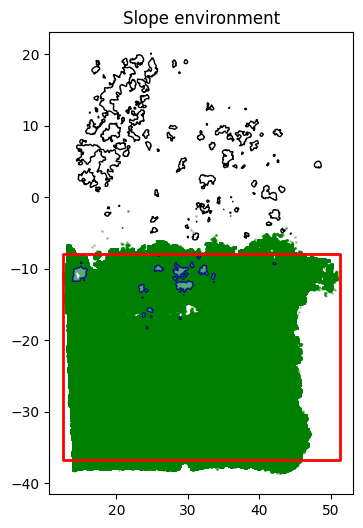

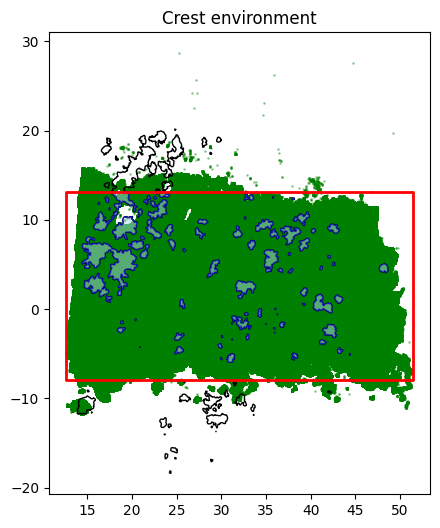

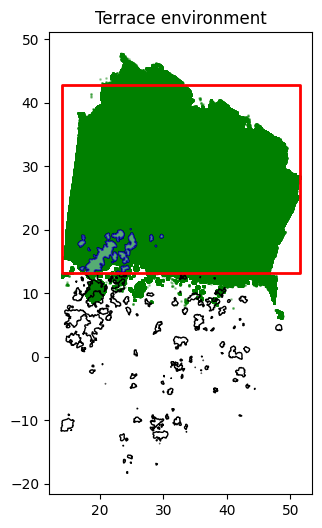

  environment  size_class  total_area  total_perimeter n_polygons  \
0       Slope  individual    3.651869        34.211486         23   
1       Slope       patch    6.358303        24.620275          3   
2       Crest  individual   13.610571       125.313626         62   
3       Crest   monostand   21.890504        83.410228          4   
4       Crest       patch   20.127590       113.119643         13   
5     Terrace  individual    1.791017        15.812524          8   
6     Terrace   monostand   14.834152        56.951979          2   
7     Terrace       patch    2.474950        16.444324          2   

      env_area  portion_of_env_area  portion_of_total_area  
0  1112.691871             0.003282               0.043096  
1  1112.691871             0.005714               0.075034  
2   819.317816             0.016612               0.160618  
3   819.317816             0.026718               0.258329  
4   819.317816             0.024566               0.237525  
5  1119.1377

In [49]:
points_all = np.asarray(kal_23_pcd.points)

# --------------------------------
# CLEAN POLYGONS ONCE
# --------------------------------
polygons_clean = polygons.copy()
polygons_clean["geometry"] = polygons_clean.geometry.buffer(0)

# --------------------------------
# CALCULATE ORIGINAL (UNCLIPPED) AREA
# --------------------------------
polygons_clean["full_area"] = polygons_clean.geometry.area

# --------------------------------
# ASSIGN SIZE CLASSES USING
# ORIGINAL FULL COLONY SIZE
# --------------------------------
polygons_clean["size_class"] = np.select(
    [
        polygons_clean["full_area"] < 1,
        (polygons_clean["full_area"] >= 1) &
        (polygons_clean["full_area"] <= np.pi),
        polygons_clean["full_area"] > np.pi
    ],
    [
        "individual",
        "patch",
        "monostand"
    ],
    default="unknown"
)

# --------------------------------
# OUTPUT DATAFRAME
# --------------------------------
env_summary = pd.DataFrame(
    columns=[
        "environment",
        "size_class",
        "total_area",
        "total_perimeter",
        "n_polygons",
        "env_area",
        "portion_of_env_area"
    ]
)

y_limit = 0

# --------------------------------
# LOOP THROUGH ENVIRONMENTS
# --------------------------------
for env, (zmin_env, zmax_env) in envs.items():

    # Select points belonging to environment
    mask = (
        (points_all[:, 2] >= zmin_env) &
        (points_all[:, 2] <= zmax_env)
    )

    env_points = points_all[mask]

    if len(env_points) == 0:
        continue

    # Define clipping extent
    xmin, xmax = np.min(env_points[:, 0]), np.max(env_points[:, 0])
    ymin, ymax = np.percentile(env_points[:, 1], [2, 98])

    if y_limit != 0:
        ymin = y_limit

    y_limit = ymax

    clip_box = box(xmin, ymin, xmax, ymax)

    clip_gdf = gpd.GeoDataFrame(
        geometry=[clip_box],
        crs=polygons.crs
    )

    # --------------------------------
    # CLIP POLYGONS
    # --------------------------------
    polygons_clipped = gpd.clip(polygons_clean, clip_gdf)

    polygons_clipped = polygons_clipped[
        ~polygons_clipped.is_empty
    ]

    # --------------------------------
    # CALCULATE CLIPPED METRICS
    # --------------------------------
    polygons_clipped["clipped_area"] = (
        polygons_clipped.geometry.area
    )

    polygons_clipped["clipped_perimeter"] = (
        polygons_clipped.geometry.length
    )

    # --------------------------------
    # SUMMARISE BY SIZE CLASS
    # (BASED ON ORIGINAL AREA)
    # --------------------------------
    class_summary = (
        polygons_clipped
        .groupby("size_class")
        .agg(
            total_area=("clipped_area", "sum"),
            total_perimeter=("clipped_perimeter", "sum"),
            n_polygons=("geometry", "count")
        )
        .reset_index()
    )

    # Add metadata
    class_summary["environment"] = env

    class_summary["env_area"] = (
        clip_gdf.area.iloc[0]
    )

    class_summary["portion_of_env_area"] = (
        class_summary["total_area"] /
        class_summary["env_area"]
    )

    # Append to output
    env_summary = pd.concat(
        [env_summary, class_summary],
        ignore_index=True
    )

    # --------------------------------
    # PLOTTING
    # --------------------------------
    fig, ax = plt.subplots(figsize=(6, 6))

    ax.scatter(
        env_points[:, 0],
        env_points[:, 1],
        s=1,
        c="green",
        alpha=0.3
    )

    polygons_clean.plot(
        ax=ax,
        edgecolor="black",
        facecolor="none"
    )

    polygons_clipped.plot(
        ax=ax,
        edgecolor="blue",
        facecolor="lightblue",
        alpha=0.5
    )

    gpd.GeoSeries(
        [clip_box],
        crs=polygons.crs
    ).plot(
        ax=ax,
        edgecolor="red",
        facecolor="none",
        linewidth=2
    )

    ax.set_title(f"{env} environment")
    ax.set_aspect("equal")

    plt.show()

# --------------------------------
# CALCULATE PORTION OF TOTAL AREA
# --------------------------------
env_summary["portion_of_total_area"] = (
    env_summary["total_area"] /
    env_summary["total_area"].sum()
)

print(env_summary)

Optimal box contains 6303148 out of 11810085 points
Box coordinates:  [[13.494195258388196, -21.014712139966907], [43.494195258388196, -6.014712139966907]]


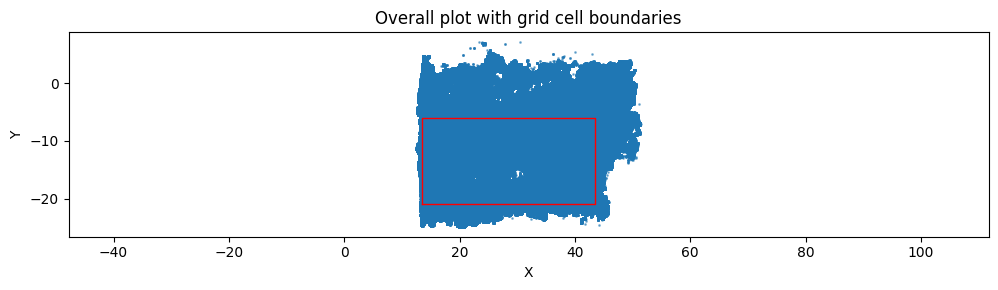

In [52]:
### cropped area 
zmax = -8.758042077676922
zmin = -22.310253607511598 
mask = (
    (kal_23_pcd.points[:,2] >= zmin) &
    (kal_23_pcd.points[:,2] <= zmax)
)
kal_23_pcd.o3d_pcd = kal_23_pcd.o3d_pcd.select_by_index(np.where(mask)[0])
(xmin, ymin), (xmax, ymax) = find_optimal_box_position(kal_23_pcd, 30, 15, 1, vis=True)


clip_box = box(xmin, ymin, xmax, ymax)
clip_gdf = gpd.GeoDataFrame(geometry=[clip_box], crs=polygons.crs)
polygons["geometry"] = polygons.geometry.buffer(0)
polygons_clipped = gpd.clip(polygons, clip_gdf)
polygons_clipped = polygons_clipped[~polygons_clipped.is_empty]
points = np.asarray(kal_23_pcd.o3d_pcd.points)

mask_xy = (
    (points[:, 0] >= xmin) & (points[:, 0] <= xmax) &
    (points[:, 1] >= ymin) & (points[:, 1] <= ymax)
)

indices = np.where(mask_xy)[0]

pcd_clipped = kal_23_pcd.o3d_pcd.select_by_index(indices)
clip_gdf["geometry"] = clip_gdf["geometry"].apply(
    lambda g: apply_matrix_to_box(g, np.linalg.inv(kal_23_pcd.world_transform))
)

clip_gdf.to_file('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/orthos/cur_kal_lar_02122023_v2_cropped_model.shp', driver='ESRI Shapefile')

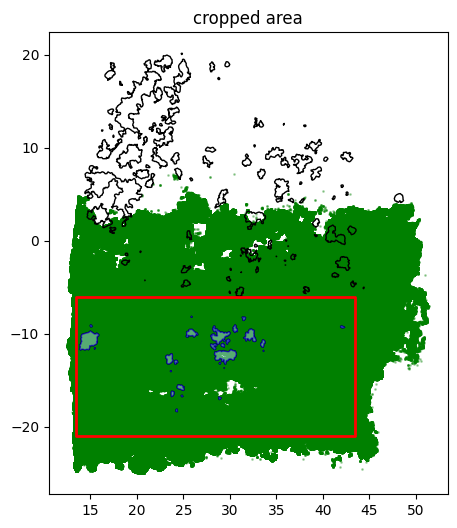

In [53]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.scatter(
    kal_23_pcd.points[:, 0],
    kal_23_pcd.points[:, 1],
    s=1,
    c="green",
    alpha=0.3
)
polygons_clean.plot(ax=ax, edgecolor="black", facecolor="none")
polygons_clipped.plot(ax=ax, edgecolor="blue", facecolor="lightblue", alpha=0.5)
gpd.GeoSeries([clip_box], crs=polygons.crs).plot(
    ax=ax, edgecolor="red", facecolor="none", linewidth=2
)

ax.set_title(f"cropped area")
ax.set_aspect("equal")
plt.show()

In [ ]:
kal_mesh = o3d.io.read_triangle_mesh('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/meshes/cur_kal_2023_mesh.obj')
kal_mesh.transform(kal_23_pcd.world_transform)
cropped_mesh = filter_mesh_by_box(kal_mesh, xmin, xmax, ymin, ymax)
area_2D = get_planar_footprint_area_union(cropped_mesh, vis=False)
area_3D = get_3D_area(cropped_mesh)
rugosity = get_3d_rugosity(area_2D, area_3D)
print(f"z based 2D area = {area_2D}, 3D area = {area_3D}, rugosity = {rugosity}")
area_2D = get_2D_footprint_area_PCA(cropped_mesh, vis=False)
area_3D = get_3D_area(cropped_mesh)
rugosity = get_3d_rugosity(area_2D, area_3D)
print(f"PCA 2D area = {area_2D}, 3D area = {area_3D}, rugosity = {rugosity}")

 2D area = 819.8873048968355, 3D area = 1584.7488075007147, rugosity = 1.9328861393946328


In [54]:
polygons_clipped = polygons_clipped[["NAME", "geometry"]]
env_summary = pd.DataFrame(
    columns=["environment", "total_area", "total_perimeter", "n_polygons"]
)

points = np.asarray(kal_23_pcd.o3d_pcd.points)
n_points = len(points)

chunk_size = 1_000_000
joined_chunks = []

for start in tqdm(range(0, n_points, chunk_size),
                  desc="Spatial join (chunked)"):

    end = min(start + chunk_size, n_points)

    chunk = points[start:end]

    gdf_points = gpd.GeoDataFrame(
        {
            "point_index": np.arange(start, end),
            "z": chunk[:, 2],
        },
        geometry=gpd.points_from_xy(chunk[:, 0], chunk[:, 1]),
        crs=polygons_clipped.crs
    )

    joined = gpd.sjoin(
        gdf_points,
        polygons_clipped,
        how="left",
        predicate="within"
    )

    joined_chunks.append(joined)

# Combine all chunks
joined_all = pd.concat(joined_chunks, ignore_index=True)

df_metrics = (
    joined_all
    .dropna(subset=["NAME"])
    .groupby("NAME")
    .agg(
        n_points=("z", "count"),
        z_min=("z", "min"),
        z_max=("z", "max"),
    )
)

df_metrics["z_range"] = df_metrics["z_max"] - df_metrics["z_min"]


poly_geom = polygons_clipped.set_index("NAME").geometry

df_metrics["area_2d"] = poly_geom.area
df_metrics["perimeter"] = poly_geom.length

df_metrics = df_metrics.reset_index().rename(columns={"NAME": "shape_id"})
df_metrics["shape_id"] = df_metrics["shape_id"] + "_kal"

joined_all["label"] = joined_all["NAME"].astype("category").cat.codes
labels = joined_all.sort_values("point_index")["label"].to_numpy()

labels[labels < 0] = -1  

colors = plt.cm.tab20(labels % 20)[:, :3]
colors[labels == -1] = [0.5, 0.5, 0.5]  

kal_23_pcd.o3d_pcd.colors = o3d.utility.Vector3dVector(colors)
o3d.visualization.draw_geometries([kal_23_pcd.o3d_pcd])

Spatial join (chunked): 100%|██████████| 12/12 [00:05<00:00,  2.25it/s]


In [55]:
envs = {
    "Slope": (-np.inf, -12.48),
    "Crest": (-12.48, -6.09),
    "Terrace": (-6.09, np.inf)
}
def get_shape_envs(z_min, z_max, envs):
    return [name for name, (emin, emax) in envs.items()
            if not (z_max < emin or z_min > emax)]
df_metrics["environments"] = df_metrics.apply(
    lambda row: get_shape_envs(row.z_min, row.z_max, envs),
    axis=1
)
# Only keep shapes with area_2d > 4
df_monostands = df_metrics[df_metrics["area_2d"] > 3.14].copy()
env_counts = df_monostands["environments"].apply(len)
n_multi_env_shapes = (env_counts > 1).sum()
print(f"Number of shapes spanning multiple environments: {n_multi_env_shapes}")

df_exploded = df_monostands.explode("environments").reset_index(drop=True)
env_summary = df_exploded.groupby("environments").agg(
    n_shapes = ("shape_id", "nunique"),
    avg_area = ("area_2d", "mean"),
    max_area = ("area_2d", "max"),
    avg_perimeter = ("perimeter", "mean"),
    max_perimeter = ("perimeter", "max")
).reset_index()
env_summary

Number of shapes spanning multiple environments: 0


,environments,n_shapes,avg_area,max_area,avg_perimeter,max_perimeter


In [56]:
area_summary = pd.DataFrame([{
    "n_shapes": df_metrics["shape_id"].nunique(),
    "avg_area": df_metrics["area_2d"].mean(),
    "total_area": df_metrics["area_2d"].sum(),
    "max_area": df_metrics["area_2d"].max(),
    "avg_perimeter": df_metrics["perimeter"].mean(),
    "total_perimeter": df_metrics["perimeter"].sum(),
    "max_perimeter": df_metrics["perimeter"].max(),
    "n_polygons": len(df_metrics),
}])
print(area_summary)

monostand_summary = pd.DataFrame([{
    "n_shapes": df_monostands["shape_id"].nunique(),
    "avg_area": df_monostands["area_2d"].mean(),
    "total_area": df_monostands["area_2d"].sum(),
    "max_area": df_monostands["area_2d"].max(),
    "avg_perimeter": df_monostands["perimeter"].mean(),
    "total_perimeter": df_monostands["perimeter"].sum(),
    "max_perimeter": df_monostands["perimeter"].max(),
    "n_polygons": len(df_monostands),
}])
print(monostand_summary)

   n_shapes  avg_area  total_area  max_area  avg_perimeter  total_perimeter  \
0        26  0.385007   10.010172  2.722894        2.26276        58.831762   

   max_perimeter  n_polygons  
0       9.209752          26  
   n_shapes  avg_area  total_area  max_area  avg_perimeter  total_perimeter  \
0         0       NaN         0.0       NaN            NaN              0.0   

   max_perimeter  n_polygons  
0            NaN           0  


In [13]:
anns.apply_transform(np.linalg.inv(kal_23_pcd.world_transform))
anns.save('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_kal/cur_kal_med_2123_orig.coords.csv')
kal_23_pcd = PointCloud('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/plys/cur_kal_med_2023_dec.ply')
visualizations.show_coords_as_lines(kal_23_pcd, anns.coords)
kal_23_agisoft_transform = np.array([ 
              [ 0.9319939100488164, 	0.022527542651117394, 	0.3617732182655799, 	9.433207225776865 ], 	
              [ 0.09047318878878055, 	0.9520197856439397, 	-0.29235753770511, 	-34.48902621384717 ], 	
              [ -0.3510013586049632, 	0.3052062213728848, 	0.8852385038467583, 	-9.587128121092636 ], 	
              [ 0, 	0, 	0, 	1 ] ])
anns.apply_transform(np.linalg.inv(kal_23_agisoft_transform))
anns.save('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_kal/cur_kal_med_23_agisoft.coords.csv')


In [47]:
kal_23_pcd.apply_transform(np.linalg.inv(kal_23_agisoft_transform))
visualizations.show_coords_as_lines(kal_23_pcd, anns.coords)

## Snakebay

In [30]:
sna_23_pcd = PointCloud('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/plys/cur_sna_med_2023_dec_v2_cropped.ply')
sna_21_pcd = PointCloud('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/plys/cur_sna_med_2021_dec.ply')

In [31]:
#Snakebay world transform
sna_align = Transform([
    [-0.29425419282752396, 1.7973680396319867, -1.2849209462365068, 394.61328115207726],
    [-2.1579935143222753, 0.04425526589648175, 0.556097744600353, -143.21711461917533],
    [0.47393849823833284, 1.317440260321023, 1.734321970782517, 242.64778992864348],
    [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00],
])
sna_23_pcd.apply_transform(sna_align)
#visualizations.show([sna_21_pcd.o3d_pcd, sna_23_pcd.o3d_pcd])

In [32]:
up_vector = [0.5470158732931798, -0.13816655088097723, -0.8256413498504991]
scale_factor = 0.2694501939953987
depth_offset = -10.138665491594404
sna_21_pcd.apply_orientation_transforms(scale_factor, up_vector, depth_offset, plot=False)

#visualizations.show_vector_in_pcd(sna_21_pcd, [0,0,1], [0,0,0], 100)

In [33]:
#up vector is inverted, so flip it
sna_21_pcd.apply_transform(Transform.from_up_vector([0,0,-1]))
#visualizations.show_vector_in_pcd(sna_21_pcd, [0,0,1], [0,0,0], 100)

In [34]:
#Apply world transform to 2023 pcd
sna_23_pcd.apply_transform(sna_21_pcd.world_transform)
#visualizations.show_vector_in_pcd(sna_23_pcd, [0,0,1], [0,0,0], 100)
sna_23_worldtrans = sna_23_pcd.world_transform
print(sna_23_worldtrans)

[[-5.89469267e-01 -8.95327778e-02  7.22059570e-02 -2.96551181e+01]
 [ 9.24227192e-02 -5.93126175e-01  1.90582406e-02 -1.39222498e+02]
 [ 6.84679450e-02  2.98170633e-02  5.95925263e-01 -1.96522767e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [15]:
visualizations.show_vector_in_pcd(sna_23_pcd, [0,0,1], [0,0,0], 100)

In [29]:
anns = Annotations('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_sna/cur_sna_med_2021_renamed.coords.csv')
anns_23 = Annotations('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_sna/cur_sna_lar_2023.coords.csv')
print(len(anns.data), len(anns_23.data))
anns_23.apply_transform(sna_align)
for ann in anns_23:
    anns.append(ann)
print(len(anns.data))
anns.apply_transform(sna_21_pcd.world_transform)
#anns.apply_transform(sna_23_pcd.world_transform)

244 83
327


In [42]:
anns.save('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_sna/cur_sna_med_2123_aligned.coords.csv')

In [37]:
anns.apply_transform(np.linalg.inv(sna_23_pcd.world_transform))
sna_23_pcd = PointCloud('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/plys/cur_sna_med_2023_dec.ply')
visualizations.show_coords_as_lines(sna_23_pcd, anns.coords)
anns.save('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_sna/cur_sna_med_2123_orig.coords.csv')


In [35]:
import geopandas as gpd
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import open3d as o3d

poly_transform =  sna_23_pcd.world_transform 

polygons = gpd.read_file('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/orthos/cur_sna_lar_01122023_v2_monostands.gpkg')


polygons["geometry"] = polygons["geometry"].apply(
    lambda g: apply_matrix_to_geom(g, poly_transform)
)

polygons = polygons[["NAME", "geometry"]]

points = np.asarray(sna_23_pcd.o3d_pcd.points)
n_points = len(points)

chunk_size = 1_000_000
joined_chunks = []

for start in tqdm(range(0, n_points, chunk_size),
                  desc="Spatial join (chunked)"):

    end = min(start + chunk_size, n_points)

    chunk = points[start:end]

    gdf_points = gpd.GeoDataFrame(
        {
            "point_index": np.arange(start, end),
            "z": chunk[:, 2],
        },
        geometry=gpd.points_from_xy(chunk[:, 0], chunk[:, 1]),
        crs=polygons.crs
    )

    joined = gpd.sjoin(
        gdf_points,
        polygons,
        how="left",
        predicate="within"
    )

    joined_chunks.append(joined)

# Combine all chunks
joined_all = pd.concat(joined_chunks, ignore_index=True)

df_metrics = (
    joined_all
    .dropna(subset=["NAME"])
    .groupby("NAME")
    .agg(
        n_points=("z", "count"),
        z_min=("z", "min"),
        z_max=("z", "max"),
    )
)

df_metrics["z_range"] = df_metrics["z_max"] - df_metrics["z_min"]


poly_geom = polygons.set_index("NAME").geometry

df_metrics["area_2d"] = poly_geom.area
df_metrics["perimeter"] = poly_geom.length

df_metrics = df_metrics.reset_index().rename(columns={"NAME": "shape_id"})
df_metrics["shape_id"] = df_metrics["shape_id"] + "_sna"

joined_all["label"] = joined_all["NAME"].astype("category").cat.codes
labels = joined_all.sort_values("point_index")["label"].to_numpy()

labels[labels < 0] = -1  

colors = plt.cm.tab20(labels % 20)[:, :3]
colors[labels == -1] = [0.5, 0.5, 0.5]  

sna_23_pcd.o3d_pcd.colors = o3d.utility.Vector3dVector(colors)
o3d.visualization.draw_geometries([sna_23_pcd.o3d_pcd])

/Users/dvan216/miniconda3/envs/unicorn_env/lib/python3.10/site-packages/pyogrio/raw.py:200: RuntimeWarning: GPKG: bad application_id=0x00000000 on '/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/orthos/cur_sna_lar_01122023_v2_monostands.gpkg'
  return ogr_read(
Spatial join (chunked): 100%|██████████| 33/33 [00:14<00:00,  2.33it/s]


In [36]:
envs = {
    "Slope": (-np.inf, -12.48),
    "Crest": (-12.48, -6.09),
    "Terrace": (-6.09, np.inf)
}
def get_shape_envs(z_min, z_max, envs):
    return [name for name, (emin, emax) in envs.items()
            if not (z_max < emin or z_min > emax)]
df_metrics["environments"] = df_metrics.apply(
    lambda row: get_shape_envs(row.z_min, row.z_max, envs),
    axis=1
)
# Only keep shapes with area_2d > 4
df_monostands = df_metrics[df_metrics["area_2d"] > 4].copy()
env_counts = df_monostands["environments"].apply(len)
n_multi_env_shapes = (env_counts > 1).sum()
print(f"Number of shapes spanning multiple environments: {n_multi_env_shapes}")

df_exploded = df_monostands.explode("environments").reset_index(drop=True)
env_summary = df_exploded.groupby("environments").agg(
    n_shapes = ("shape_id", "nunique"),
    avg_area = ("area_2d", "mean"),
    max_area = ("area_2d", "max"),
    avg_perimeter = ("perimeter", "mean"),
    max_perimeter = ("perimeter", "max")
).reset_index()
env_summary

Number of shapes spanning multiple environments: 7


,environments,n_shapes,avg_area,max_area,avg_perimeter,max_perimeter
0,Crest,9,14.914267,39.977525,30.243116,57.099682
1,Slope,5,18.738497,39.977525,36.136365,57.099682
2,Terrace,2,12.625387,15.542193,30.110318,33.161962


In [37]:
df_mono_sna_full = df_metrics.explode("environments")
df_mono_sna_full = df_mono_sna_full.rename(columns={"environments": "Environment"})
df_mono_sna_full["Site"] = "Snakebay"

/var/folders/xr/rc7k1bhn7v1clp5xmy1chxxc0000gr/T/ipykernel_58439/246349118.py:130: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  env_summary = pd.concat(


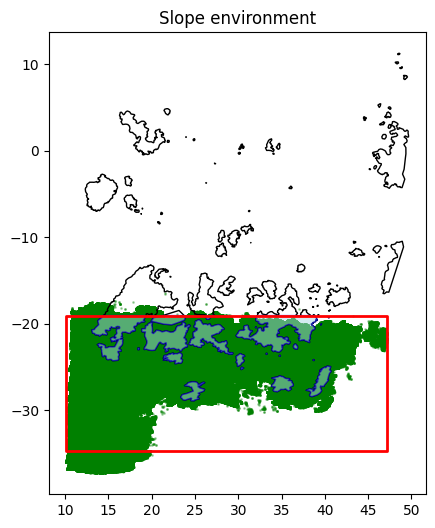

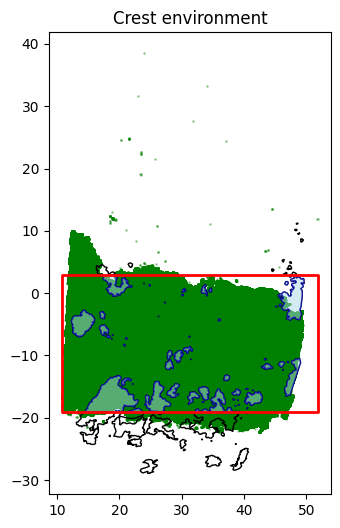

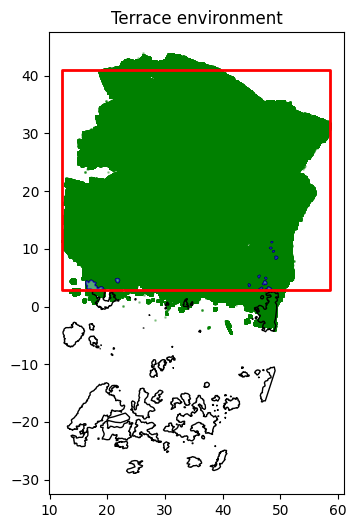

  environment  size_class  total_area  total_perimeter n_polygons  \
0       Slope  individual    1.205999        10.153651         11   
1       Slope   monostand   58.310498       150.128100          7   
2       Slope       patch    7.759598        31.290615          3   
3       Crest  individual    7.001030        60.777012         45   
4       Crest   monostand   84.163849       177.274765          9   
5       Crest       patch   10.008952        42.874335          6   
6     Terrace  individual    1.161541        13.804311         10   
7     Terrace   monostand    2.984597        12.350500          2   

      env_area  portion_of_env_area  portion_of_total_area  
0   579.423445             0.002081               0.006987  
1   579.423445             0.100635               0.337844  
2   579.423445             0.013392               0.044958  
3   901.505830             0.007766               0.040563  
4   901.505830             0.093359               0.487635  
5   901.5058

In [39]:
points_all = np.asarray(sna_23_pcd.points)

# --------------------------------
# CLEAN POLYGONS ONCE
# --------------------------------
polygons_clean = polygons.copy()
polygons_clean["geometry"] = polygons_clean.geometry.buffer(0)

# --------------------------------
# CALCULATE ORIGINAL (UNCLIPPED) AREA
# --------------------------------
polygons_clean["full_area"] = polygons_clean.geometry.area

# --------------------------------
# ASSIGN SIZE CLASSES USING
# ORIGINAL FULL COLONY SIZE
# --------------------------------
polygons_clean["size_class"] = np.select(
    [
        polygons_clean["full_area"] < 1,
        (polygons_clean["full_area"] >= 1) &
        (polygons_clean["full_area"] <= np.pi),
        polygons_clean["full_area"] > np.pi
    ],
    [
        "individual",
        "patch",
        "monostand"
    ],
    default="unknown"
)

# --------------------------------
# OUTPUT DATAFRAME
# --------------------------------
env_summary = pd.DataFrame(
    columns=[
        "environment",
        "size_class",
        "total_area",
        "total_perimeter",
        "n_polygons",
        "env_area",
        "portion_of_env_area"
    ]
)

y_limit = 0

# --------------------------------
# LOOP THROUGH ENVIRONMENTS
# --------------------------------
for env, (zmin_env, zmax_env) in envs.items():

    # Select points belonging to environment
    mask = (
        (points_all[:, 2] >= zmin_env) &
        (points_all[:, 2] <= zmax_env)
    )

    env_points = points_all[mask]

    if len(env_points) == 0:
        continue

    # Define clipping extent
    xmin, xmax = np.min(env_points[:, 0]), np.max(env_points[:, 0])
    ymin, ymax = np.percentile(env_points[:, 1], [2, 98])

    if y_limit != 0:
        ymin = y_limit

    y_limit = ymax

    clip_box = box(xmin, ymin, xmax, ymax)

    clip_gdf = gpd.GeoDataFrame(
        geometry=[clip_box],
        crs=polygons.crs
    )

    # --------------------------------
    # CLIP POLYGONS
    # --------------------------------
    polygons_clipped = gpd.clip(polygons_clean, clip_gdf)

    polygons_clipped = polygons_clipped[
        ~polygons_clipped.is_empty
    ]

    # --------------------------------
    # CALCULATE CLIPPED METRICS
    # --------------------------------
    polygons_clipped["clipped_area"] = (
        polygons_clipped.geometry.area
    )

    polygons_clipped["clipped_perimeter"] = (
        polygons_clipped.geometry.length
    )

    # --------------------------------
    # SUMMARISE BY SIZE CLASS
    # (BASED ON ORIGINAL AREA)
    # --------------------------------
    class_summary = (
        polygons_clipped
        .groupby("size_class")
        .agg(
            total_area=("clipped_area", "sum"),
            total_perimeter=("clipped_perimeter", "sum"),
            n_polygons=("geometry", "count")
        )
        .reset_index()
    )

    # Add metadata
    class_summary["environment"] = env

    class_summary["env_area"] = (
        clip_gdf.area.iloc[0]
    )

    class_summary["portion_of_env_area"] = (
        class_summary["total_area"] /
        class_summary["env_area"]
    )

    # Append to output
    env_summary = pd.concat(
        [env_summary, class_summary],
        ignore_index=True
    )

    # --------------------------------
    # PLOTTING
    # --------------------------------
    fig, ax = plt.subplots(figsize=(6, 6))

    ax.scatter(
        env_points[:, 0],
        env_points[:, 1],
        s=1,
        c="green",
        alpha=0.3
    )

    polygons_clean.plot(
        ax=ax,
        edgecolor="black",
        facecolor="none"
    )

    polygons_clipped.plot(
        ax=ax,
        edgecolor="blue",
        facecolor="lightblue",
        alpha=0.5
    )

    gpd.GeoSeries(
        [clip_box],
        crs=polygons.crs
    ).plot(
        ax=ax,
        edgecolor="red",
        facecolor="none",
        linewidth=2
    )

    ax.set_title(f"{env} environment")
    ax.set_aspect("equal")

    plt.show()

# --------------------------------
# CALCULATE PORTION OF TOTAL AREA
# --------------------------------
env_summary["portion_of_total_area"] = (
    env_summary["total_area"] /
    env_summary["total_area"].sum()
)

print(env_summary)

Optimal box contains 12066269 out of 17520852 points
Box coordinates:  [[11.267095295208701, -28.157189932706693], [41.267095295208705, -13.157189932706693]]


NameError: name 'pts' is not defined

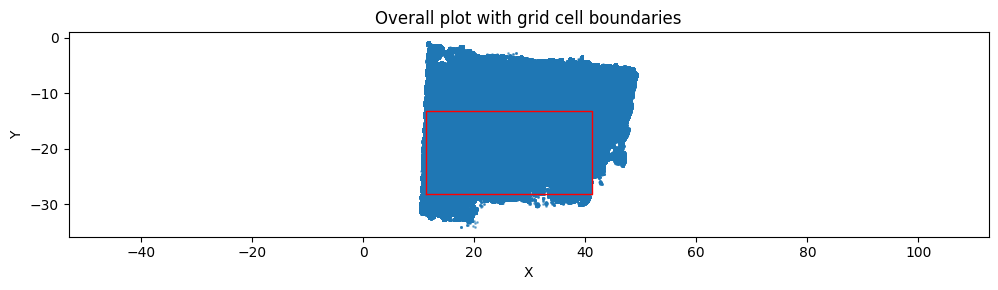

In [25]:
### comparison with SEA 2021
zmax = -7.341819763740662
zmin = -24.82286629941279
mask = (
    (sna_23_pcd.points[:,2] >= zmin) &
    (sna_23_pcd.points[:,2] <= zmax)
)
sna_23_pcd.o3d_pcd = sna_23_pcd.o3d_pcd.select_by_index(np.where(mask)[0])
(xmin, ymin), (xmax, ymax) = find_optimal_box_position(sna_23_pcd, 30, 15, 1, vis=True)
mask = (
    (pts[:, 0] >= xmin) &
    (pts[:, 0] <= xmax) &
    (pts[:, 1] >= ymin) &
    (pts[:, 1] <= ymax)
)
pts = np.asarray(sna_23_pcd.points)
from shapely.geometry import box


clip_box = box(xmin, ymin, xmax, ymax)
clip_gdf = gpd.GeoDataFrame(geometry=[clip_box], crs=polygons.crs)
polygons["geometry"] = polygons.geometry.buffer(0)
polygons_clipped = gpd.clip(polygons, clip_gdf)
polygons_clipped = polygons_clipped[~polygons_clipped.is_empty]

clip_gdf["geometry"] = clip_gdf["geometry"].apply(
    lambda g: apply_matrix_to_box(g, np.linalg.inv(sna_23_pcd.world_transform))
)
clip_gdf.to_file('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/orthos/cur_sna_med_dec_2023_cropped_model.shp', driver='ESRI Shapefile')
zmin_box, zmax_box = pts[mask][:, 2].min(), pts[mask][:, 2].max()
print(zmin_box, zmax_box)

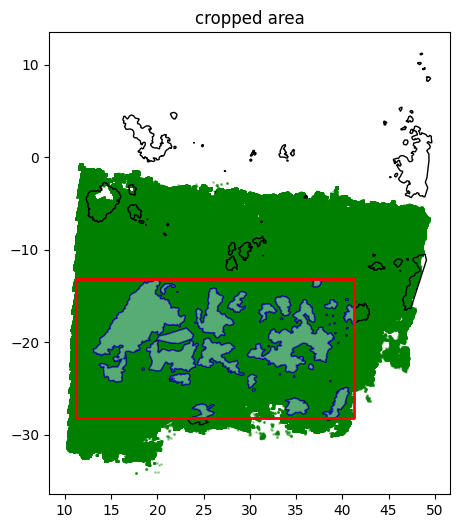

In [ ]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.scatter(
    sna_23_pcd.points[:, 0],
    sna_23_pcd.points[:, 1],
    s=1,
    c="green",
    alpha=0.3
)
polygons_clean.plot(ax=ax, edgecolor="black", facecolor="none")
polygons_clipped.plot(ax=ax, edgecolor="blue", facecolor="lightblue", alpha=0.5)
gpd.GeoSeries([clip_box], crs=polygons.crs).plot(

    ax=ax, edgecolor="red", facecolor="none", linewidth=2
)

ax.set_title(f"cropped area")
ax.set_aspect("equal")
plt.show()

In [46]:
sna_mesh = o3d.io.read_triangle_mesh('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/meshes/cur_sna_2023_mesh.obj')
sna_mesh.transform(sna_23_pcd.world_transform)
cropped_mesh = filter_mesh_by_box(sna_mesh, xmin, xmax, ymin, ymax)
area_2D = get_planar_footprint_area_union(cropped_mesh, vis=False)
area_3D = get_3D_area(cropped_mesh)
rugosity = get_3d_rugosity(area_2D, area_3D)
print(f"z based 2D area = {area_2D}, 3D area = {area_3D}, rugosity = {rugosity}")
area_2D = get_2D_footprint_area_PCA(cropped_mesh, vis=False)
area_3D = get_3D_area(cropped_mesh)
rugosity = get_3d_rugosity(area_2D, area_3D)
print(f"PCA 2D area = {area_2D}, 3D area = {area_3D}, rugosity = {rugosity}")

z based 2D area = 447.94560120183377, 3D area = 2814.0507908922414, rugosity = 6.282126185282699
PCA 2D area = 1677.5901755341606, 3D area = 2814.0507908922414, rugosity = 1.677436379833484


In [153]:
polygons_clipped = polygons_clipped[["NAME", "geometry"]]

points = np.asarray(sna_23_pcd.o3d_pcd.points)
n_points = len(points)

chunk_size = 1_000_000
joined_chunks = []

for start in tqdm(range(0, n_points, chunk_size),
                  desc="Spatial join (chunked)"):

    end = min(start + chunk_size, n_points)

    chunk = points[start:end]

    gdf_points = gpd.GeoDataFrame(
        {
            "point_index": np.arange(start, end),
            "z": chunk[:, 2],
        },
        geometry=gpd.points_from_xy(chunk[:, 0], chunk[:, 1]),
        crs=polygons_clipped.crs
    )

    joined = gpd.sjoin(
        gdf_points,
        polygons_clipped,
        how="left",
        predicate="within"
    )

    joined_chunks.append(joined)

# Combine all chunks
joined_all = pd.concat(joined_chunks, ignore_index=True)

df_metrics = (
    joined_all
    .dropna(subset=["NAME"])
    .groupby("NAME")
    .agg(
        n_points=("z", "count"),
        z_min=("z", "min"),
        z_max=("z", "max"),
    )
)

df_metrics["z_range"] = df_metrics["z_max"] - df_metrics["z_min"]


poly_geom = polygons_clipped.set_index("NAME").geometry

df_metrics["area_2d"] = poly_geom.area
df_metrics["perimeter"] = poly_geom.length

df_metrics = df_metrics.reset_index().rename(columns={"NAME": "shape_id"})
df_metrics["shape_id"] = df_metrics["shape_id"] + "_sna"

joined_all["label"] = joined_all["NAME"].astype("category").cat.codes
labels = joined_all.sort_values("point_index")["label"].to_numpy()

labels[labels < 0] = -1  

colors = plt.cm.tab20(labels % 20)[:, :3]
colors[labels == -1] = [0.5, 0.5, 0.5]  

sna_23_pcd.o3d_pcd.colors = o3d.utility.Vector3dVector(colors)
o3d.visualization.draw_geometries([sna_23_pcd.o3d_pcd])

Spatial join (chunked): 100%|██████████| 18/18 [00:09<00:00,  1.93it/s]


In [154]:
envs = {
    "Slope": (-np.inf, -12.48),
    "Crest": (-12.48, -6.09),
    "Terrace": (-6.09, np.inf)
}
def get_shape_envs(z_min, z_max, envs):
    return [name for name, (emin, emax) in envs.items()
            if not (z_max < emin or z_min > emax)]
df_metrics["environments"] = df_metrics.apply(
    lambda row: get_shape_envs(row.z_min, row.z_max, envs),
    axis=1
)
# Only keep shapes with area_2d > 4
df_monostands = df_metrics[df_metrics["area_2d"] > 3.14].copy()
env_counts = df_monostands["environments"].apply(len)
n_multi_env_shapes = (env_counts > 1).sum()
print(f"Number of shapes spanning multiple environments: {n_multi_env_shapes}")

df_exploded = df_monostands.explode("environments").reset_index(drop=True)
env_summary = df_exploded.groupby("environments").agg(
    n_shapes = ("shape_id", "nunique"),
    avg_area = ("area_2d", "mean"),
    max_area = ("area_2d", "max"),
    avg_perimeter = ("perimeter", "mean"),
    max_perimeter = ("perimeter", "max")
).reset_index()
env_summary

Number of shapes spanning multiple environments: 6


,environments,n_shapes,avg_area,max_area,avg_perimeter,max_perimeter
0,Crest,6,16.249974,39.978928,31.451434,56.984194
1,Slope,7,14.418686,39.978928,28.873321,56.984194


In [155]:
area_summary = pd.DataFrame([{
    "n_shapes": df_metrics["shape_id"].nunique(),
    "avg_area": df_metrics["area_2d"].mean(),
    "total_area": df_metrics["area_2d"].sum(),
    "max_area": df_metrics["area_2d"].max(),
    "avg_perimeter": df_metrics["perimeter"].mean(),
    "total_perimeter": df_metrics["perimeter"].sum(),
    "max_perimeter": df_metrics["perimeter"].max(),
    "n_polygons": len(df_metrics),
}])
print(area_summary)

monostand_summary = pd.DataFrame([{
    "n_shapes": df_monostands["shape_id"].nunique(),
    "avg_area": df_monostands["area_2d"].mean(),
    "total_area": df_monostands["area_2d"].sum(),
    "max_area": df_monostands["area_2d"].max(),
    "avg_perimeter": df_monostands["perimeter"].mean(),
    "total_perimeter": df_monostands["perimeter"].sum(),
    "max_perimeter": df_monostands["perimeter"].max(),
    "n_polygons": len(df_monostands),
}])
print(monostand_summary)

   n_shapes  avg_area  total_area   max_area  avg_perimeter  total_perimeter  \
0        37  3.187013  117.919487  39.978928       7.826295       289.572909   

   max_perimeter  n_polygons  
0      56.984194          37  
   n_shapes   avg_area  total_area   max_area  avg_perimeter  total_perimeter  \
0         7  14.418686  100.930805  39.978928      28.873321       202.113246   

   max_perimeter  n_polygons  
0      56.984194           7  


In [163]:
df_mono_sna_clipped = df_metrics.explode("environments")
df_mono_sna_clipped = df_mono_sna_clipped.rename(columns={"environments": "Environment"})
df_mono_sna_clipped["Site"] = "Snakebay"


## Sea Aquarium

In [5]:
sea_21_pcd = PointCloud('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/plys/cur_sea_med_2021_dec.ply')

In [6]:
up_vector = [-0.5562032606420941, -0.3455544749951403, -0.7557976168670657]
scale_factor = 0.31287909324304974
depth_offset = -10.669366562859535

sea_21_pcd.apply_orientation_transforms(scale_factor, up_vector, depth_offset, plot=False)

#visualizations.show_vector_in_pcd(sea_21_pcd, [0,0,1], [0,0,0], 100)

In [7]:
#up vector is inverted, so flip it
sea_21_pcd.apply_transform(Transform.from_up_vector([0,0,-1]))
visualizations.show_vector_in_pcd(sea_21_pcd, [0,0,1], [0,0,0], 100)
sea_21_worldtrans = sea_21_pcd.world_transform
print(sea_21_worldtrans)

[[-2.61549070e-02 -2.75826956e-01  1.45357277e-01  2.87144647e+01]
 [ 2.58698214e-01 -1.00616008e-01 -1.44377907e-01 -1.02348468e+01]
 [ 1.74024372e-01  1.08116771e-01  2.36473273e-01 -1.06693666e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [159]:
anns = Annotations('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_sea/cur_sea_med_2021_renamed.coords.csv')
print(len(anns.data))
anns.apply_transform(sea_21_pcd.world_transform)
visualizations.show_coords_as_lines(sea_21_pcd, anns.coords)

132


In [83]:
anns.save('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_sea/cur_sea_med_21_aligned.coords.csv')

In [243]:
anns.apply_transform(np.linalg.inv(sea_21_pcd.world_transform))
sea_21_pcd = PointCloud('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/plys/cur_sea_med_2021_dec.ply')
sea_21_agisoft_transform = np.array([ 
              [ 1.0821719768229894, 	0.01181971104920912, 	0.1492710472941049, 	2.7654210809536357 ], 	
              [ -0.08012448142315919, 	0.9657482857670636, 	0.5044086186468164, 	8.314271791537106 ], 	
              [ -0.12649750434785761, 	-0.5105960061724237, 	0.9575008294644278, 	1.392416377615157 ], 	
              [ 0, 	0, 	0, 	1 ] ])
anns.apply_transform(np.linalg.inv(sea_21_agisoft_transform))
anns.save('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_sea/cur_sea_med_21_agisoft.coords.csv')


In [8]:
####Monostand records
sea_21_agisoft_transform = np.array([ 
              [ 1.0821719768229894, 	0.01181971104920912, 	0.1492710472941049, 	2.7654210809536357 ], 	
              [ -0.08012448142315919, 	0.9657482857670636, 	0.5044086186468164, 	8.314271791537106 ], 	
              [ -0.12649750434785761, 	-0.5105960061724237, 	0.9575008294644278, 	1.392416377615157 ], 	
              [ 0, 	0, 	0, 	1 ] ])

poly_transform =  sea_21_pcd.world_transform @ sea_21_agisoft_transform

polygons = gpd.read_file('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/orthos/cur_sea_med_2021_agisoft_monostands.gpkg')

polygons["geometry"] = polygons["geometry"].apply(
    lambda g: apply_matrix_to_geom(g, poly_transform)
)

polygons = polygons[["NAME", "geometry"]]

points = np.asarray(sea_21_pcd.o3d_pcd.points)
n_points = len(points)

chunk_size = 1_000_000
joined_chunks = []

for start in tqdm(range(0, n_points, chunk_size),
                  desc="Spatial join (chunked)"):

    end = min(start + chunk_size, n_points)

    chunk = points[start:end]

    gdf_points = gpd.GeoDataFrame(
        {
            "point_index": np.arange(start, end),
            "z": chunk[:, 2],
        },
        geometry=gpd.points_from_xy(chunk[:, 0], chunk[:, 1]),
        crs=polygons.crs
    )

    joined = gpd.sjoin(
        gdf_points,
        polygons,
        how="left",
        predicate="within"
    )

    joined_chunks.append(joined)

# Combine all chunks
joined_all = pd.concat(joined_chunks, ignore_index=True)

df_metrics = (
    joined_all
    .dropna(subset=["NAME"])
    .groupby("NAME")
    .agg(
        n_points=("z", "count"),
        z_min=("z", "min"),
        z_max=("z", "max"),
    )
)

df_metrics["z_range"] = df_metrics["z_max"] - df_metrics["z_min"]


poly_geom = polygons.set_index("NAME").geometry

df_metrics["area_2d"] = poly_geom.area
df_metrics["perimeter"] = poly_geom.length

df_metrics = df_metrics.reset_index().rename(columns={"NAME": "shape_id"})
df_metrics["shape_id"] = df_metrics["shape_id"] + "_sea"

joined_all["label"] = joined_all["NAME"].astype("category").cat.codes
labels = joined_all.sort_values("point_index")["label"].to_numpy()

labels[labels < 0] = -1  

colors = plt.cm.tab20(labels % 20)[:, :3]
colors[labels == -1] = [0.5, 0.5, 0.5]  

sea_21_pcd.o3d_pcd.colors = o3d.utility.Vector3dVector(colors)
o3d.visualization.draw_geometries([sea_21_pcd.o3d_pcd])


/Users/dvan216/miniconda3/envs/unicorn_env/lib/python3.10/site-packages/pyogrio/raw.py:200: RuntimeWarning: GPKG: bad application_id=0x00000000 on '/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/orthos/cur_sea_med_2021_agisoft_monostands.gpkg'
  return ogr_read(
Spatial join (chunked): 100%|██████████| 50/50 [00:23<00:00,  2.09it/s]


In [9]:
envs = {
    "Slope": (-np.inf, -12.48),
    "Crest": (-12.48, np.inf)
}
def get_shape_envs(z_min, z_max, envs):
    return [name for name, (emin, emax) in envs.items()
            if not (z_max < emin or z_min > emax)]
df_metrics["environments"] = df_metrics.apply(
    lambda row: get_shape_envs(row.z_min, row.z_max, envs),
    axis=1
)
# Only keep shapes with area_2d > 4
df_monostands = df_metrics[df_metrics["area_2d"] > 4].copy()
env_counts = df_monostands["environments"].apply(len)
n_multi_env_shapes = (env_counts > 1).sum()
print(f"Number of shapes spanning multiple environments: {n_multi_env_shapes}")

df_exploded = df_monostands.explode("environments").reset_index(drop=True)
env_summary = df_exploded.groupby("environments").agg(
    n_shapes = ("shape_id", "nunique"),
    avg_area = ("area_2d", "mean"),
    max_area = ("area_2d", "max"),
    avg_perimeter = ("perimeter", "mean"),
    max_perimeter = ("perimeter", "max")
).reset_index()
env_summary

Number of shapes spanning multiple environments: 2


,environments,n_shapes,avg_area,max_area,avg_perimeter,max_perimeter
0,Crest,2,10.814768,17.512567,34.566429,55.566525
1,Slope,2,10.814768,17.512567,34.566429,55.566525


In [10]:
df_mono_sea_full = df_metrics.explode("environments")
df_mono_sea_full = df_mono_sea_full.rename(columns={"environments": "Environment"})
df_mono_sea_full["Site"] = "Sea Aquarium"

/var/folders/xr/rc7k1bhn7v1clp5xmy1chxxc0000gr/T/ipykernel_58439/978574934.py:83: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  env_summary = pd.concat(


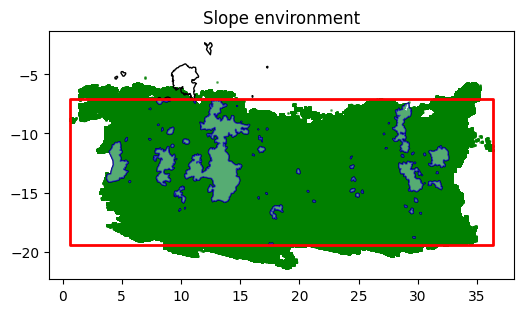

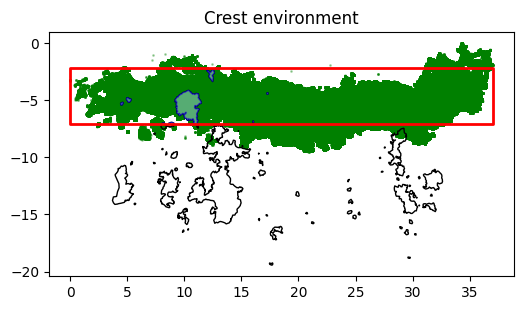

  environment  size_class  total_area  total_perimeter n_polygons    env_area  \
0       Slope  individual    3.180884        49.758695         50  440.713826   
1       Slope   monostand   20.797675        64.909131          2  440.713826   
2       Slope       patch   10.248347        51.824022          4  440.713826   
3       Crest  individual    0.504901         7.776559          6  183.949005   
4       Crest   monostand    4.088087        12.565117          1  183.949005   

   portion_of_env_area  portion_of_total_area  
0             0.007218               0.081940  
1             0.047191               0.535748  
2             0.023254               0.263997  
3             0.002745               0.013006  
4             0.022224               0.105309  


In [ ]:
points_all = np.asarray(sea_21_pcd.points)

# --------------------------------
# CLEAN POLYGONS ONCE
# --------------------------------
polygons_clean = polygons.copy()
polygons_clean["geometry"] = polygons_clean.geometry.buffer(0)

# --------------------------------
# CALCULATE ORIGINAL (UNCLIPPED) AREA
# --------------------------------
polygons_clean["full_area"] = polygons_clean.geometry.area

# --------------------------------
# ASSIGN SIZE CLASSES USING
# ORIGINAL FULL COLONY SIZE
# --------------------------------
polygons_clean["size_class"] = np.select(
    [
        polygons_clean["full_area"] < 1,
        (polygons_clean["full_area"] >= 1) &
        (polygons_clean["full_area"] <= np.pi),
        polygons_clean["full_area"] > np.pi
    ],
    [
        "individual",
        "patch",
        "monostand"
    ],
    default="unknown"
)

# --------------------------------
# OUTPUT DATAFRAME
# --------------------------------
env_summary = pd.DataFrame(
    columns=[
        "environment",
        "size_class",
        "total_area",
        "total_perimeter",
        "n_polygons",
        "env_area",
        "portion_of_env_area"
    ]
)

y_limit = 0

# --------------------------------
# LOOP THROUGH ENVIRONMENTS
# --------------------------------
for env, (zmin_env, zmax_env) in envs.items():

    # Select points belonging to environment
    mask = (
        (points_all[:, 2] >= zmin_env) &
        (points_all[:, 2] <= zmax_env)
    )

    env_points = points_all[mask]

    if len(env_points) == 0:
        continue

    # Define clipping extent
    xmin, xmax = np.min(env_points[:, 0]), np.max(env_points[:, 0])
    ymin, ymax = np.percentile(env_points[:, 1], [2, 98])

    if y_limit != 0:
        ymin = y_limit

    y_limit = ymax

    clip_box = box(xmin, ymin, xmax, ymax)

    clip_gdf = gpd.GeoDataFrame(
        geometry=[clip_box],
        crs=polygons.crs
    )

    # --------------------------------
    # CLIP POLYGONS
    # --------------------------------
    polygons_clipped = gpd.clip(polygons_clean, clip_gdf)

    polygons_clipped = polygons_clipped[
        ~polygons_clipped.is_empty
    ]

    # --------------------------------
    # CALCULATE CLIPPED METRICS
    # --------------------------------
    polygons_clipped["clipped_area"] = (
        polygons_clipped.geometry.area
    )

    polygons_clipped["clipped_perimeter"] = (
        polygons_clipped.geometry.length
    )

    # --------------------------------
    # SUMMARISE BY SIZE CLASS
    # (BASED ON ORIGINAL AREA)
    # --------------------------------
    class_summary = (
        polygons_clipped
        .groupby("size_class")
        .agg(
            total_area=("clipped_area", "sum"),
            total_perimeter=("clipped_perimeter", "sum"),
            n_polygons=("geometry", "count")
        )
        .reset_index()
    )

    # Add metadata
    class_summary["environment"] = env

    class_summary["env_area"] = (
        clip_gdf.area.iloc[0]
    )

    class_summary["portion_of_env_area"] = (
        class_summary["total_area"] /
        class_summary["env_area"]
    )

    # Append to output
    env_summary = pd.concat(
        [env_summary, class_summary],
        ignore_index=True
    )

    # --------------------------------
    # PLOTTING
    # --------------------------------
    fig, ax = plt.subplots(figsize=(6, 6))

    ax.scatter(
        env_points[:, 0],
        env_points[:, 1],
        s=1,
        c="green",
        alpha=0.3
    )

    polygons_clean.plot(
        ax=ax,
        edgecolor="black",
        facecolor="none"
    )

    polygons_clipped.plot(
        ax=ax,
        edgecolor="blue",
        facecolor="lightblue",
        alpha=0.5
    )

    gpd.GeoSeries(
        [clip_box],
        crs=polygons.crs
    ).plot(
        ax=ax,
        edgecolor="red",
        facecolor="none",
        linewidth=2
    )

    ax.set_title(f"{env} environment")
    ax.set_aspect("equal")

    plt.show()

# --------------------------------
# CALCULATE PORTION OF TOTAL AREA
# --------------------------------
env_summary["portion_of_total_area"] = (
    env_summary["total_area"] /
    env_summary["total_area"].sum()
)

print(env_summary)

Optimal box contains 44759197 out of 50000000 points
Box coordinates:  [[4.0, -18.363944521920956], [34.0, -3.3639445219209563]]
Max Z in box: -7.341819763740662
Min Z in box: -24.82286629941279


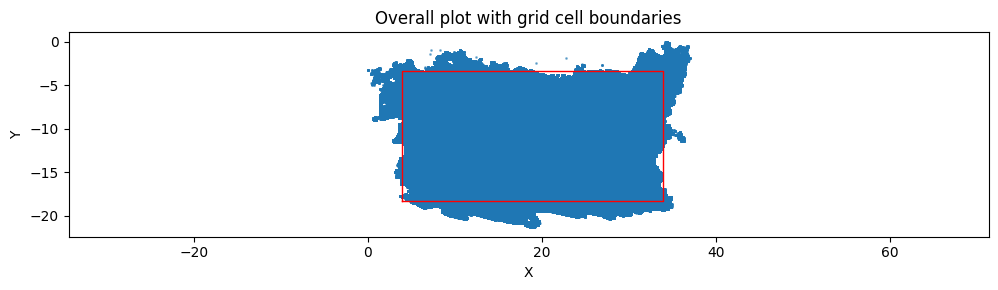

In [ ]:
(xmin, ymin), (xmax, ymax) = find_optimal_box_position(sea_21_pcd, 30, 15, 1, vis=True)
mask = (
    (sea_21_pcd.points[:,0] >= xmin) &
    (sea_21_pcd.points[:,0] <= xmax) &
    (sea_21_pcd.points[:,1] >= ymin) &
    (sea_21_pcd.points[:,1] <= ymax)
)
z_max = np.max(sea_21_pcd.points[mask, 2])
z_min = np.min(sea_21_pcd.points[mask, 2])
print(f"Max Z in box: {z_max}")
print(f"Min Z in box: {z_min}")

In [ ]:
from shapely.geometry import box
clip_box = box(xmin, ymin, xmax, ymax)
clip_gdf = gpd.GeoDataFrame(geometry=[clip_box], crs=polygons.crs)
polygons["geometry"] = polygons.geometry.buffer(0)
polygons_clipped = gpd.clip(polygons, clip_gdf)
polygons_clipped = polygons_clipped[~polygons_clipped.is_empty]

clip_gdf.to_file('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/orthos/cur_sea_lar_2021_v2_cropped_model.shp', driver='ESRI Shapefile')

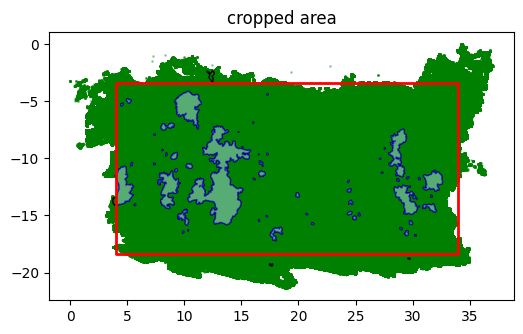

In [ ]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.scatter(
    sea_21_pcd.points[:, 0],
    sea_21_pcd.points[:, 1],
    s=1,
    c="green",
    alpha=0.3
)
polygons_clean.plot(ax=ax, edgecolor="black", facecolor="none")
polygons_clipped.plot(ax=ax, edgecolor="blue", facecolor="lightblue", alpha=0.5)
gpd.GeoSeries([clip_box], crs=polygons.crs).plot(
    ax=ax, edgecolor="red", facecolor="none", linewidth=2
)

ax.set_title(f"cropped area")
ax.set_aspect("equal")
plt.show()

In [ ]:
sea_mesh = o3d.io.read_triangle_mesh('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/meshes/cur_sea_2021_mesh.obj')
sea_mesh.transform(sea_21_pcd.world_transform)
cropped_mesh = filter_mesh_by_box(sea_mesh, xmin, xmax, ymin, ymax)
area_2D = get_planar_footprint_area_union(cropped_mesh, vis=False)
area_3D = get_3D_area(cropped_mesh)
rugosity = get_3d_rugosity(area_2D, area_3D)
print(f"z based 2D area = {area_2D}, 3D area = {area_3D}, rugosity = {rugosity}")
area_2D = get_2D_footprint_area_PCA(cropped_mesh, vis=False)
area_3D = get_3D_area(cropped_mesh)
rugosity = get_3d_rugosity(area_2D, area_3D)
print(f"PCA 2D area = {area_2D}, 3D area = {area_3D}, rugosity = {rugosity}")

z based 2D area = 446.17669231831115, 3D area = 1436.1121734209119, rugosity = 3.2187072927519966
PCA 2D area = 804.2367282102877, 3D area = 1436.1121734209119, rugosity = 1.7856833977438105


In [ ]:
polygons_clipped = polygons_clipped[["NAME", "geometry"]]

points = np.asarray(sea_21_pcd.o3d_pcd.points)
n_points = len(points)

chunk_size = 1_000_000
joined_chunks = []

for start in tqdm(range(0, n_points, chunk_size),
                  desc="Spatial join (chunked)"):

    end = min(start + chunk_size, n_points)

    chunk = points[start:end]

    gdf_points = gpd.GeoDataFrame(
        {
            "point_index": np.arange(start, end),
            "z": chunk[:, 2],
        },
        geometry=gpd.points_from_xy(chunk[:, 0], chunk[:, 1]),
        crs=polygons.crs
    )

    joined = gpd.sjoin(
        gdf_points,
        polygons_clipped,
        how="left",
        predicate="within"
    )

    joined_chunks.append(joined)

# Combine all chunks
joined_all = pd.concat(joined_chunks, ignore_index=True)

df_metrics = (
    joined_all
    .dropna(subset=["NAME"])
    .groupby("NAME")
    .agg(
        n_points=("z", "count"),
        z_min=("z", "min"),
        z_max=("z", "max"),
    )
)

df_metrics["z_range"] = df_metrics["z_max"] - df_metrics["z_min"]


poly_geom = polygons_clipped.set_index("NAME").geometry

df_metrics["area_2d"] = poly_geom.area
df_metrics["perimeter"] = poly_geom.length

df_metrics = df_metrics.reset_index().rename(columns={"NAME": "shape_id"})
df_metrics["shape_id"] = df_metrics["shape_id"] + "_sea"

joined_all["label"] = joined_all["NAME"].astype("category").cat.codes
labels = joined_all.sort_values("point_index")["label"].to_numpy()

labels[labels < 0] = -1  

colors = plt.cm.tab20(labels % 20)[:, :3]
colors[labels == -1] = [0.5, 0.5, 0.5]  

sea_21_pcd.o3d_pcd.colors = o3d.utility.Vector3dVector(colors)
o3d.visualization.draw_geometries([sea_21_pcd.o3d_pcd])


Spatial join (chunked): 100%|██████████| 50/50 [00:32<00:00,  1.55it/s]


In [ ]:
envs = {
    "Slope": (-np.inf, -12.48),
    "Crest": (-12.48, np.inf)
}
def get_shape_envs(z_min, z_max, envs):
    return [name for name, (emin, emax) in envs.items()
            if not (z_max < emin or z_min > emax)]
df_metrics["environments"] = df_metrics.apply(
    lambda row: get_shape_envs(row.z_min, row.z_max, envs),
    axis=1
)
# Only keep shapes with area_2d > 4
df_monostands = df_metrics[df_metrics["area_2d"] > 4].copy()
env_counts = df_monostands["environments"].apply(len)
n_multi_env_shapes = (env_counts > 1).sum()
print(f"Number of shapes spanning multiple environments: {n_multi_env_shapes}")

df_exploded = df_monostands.explode("environments").reset_index(drop=True)
env_summary = df_exploded.groupby("environments").agg(
    n_shapes = ("shape_id", "nunique"),
    avg_area = ("area_2d", "mean"),
    max_area = ("area_2d", "max"),
    avg_perimeter = ("perimeter", "mean"),
    max_perimeter = ("perimeter", "max")
).reset_index()
env_summary

Number of shapes spanning multiple environments: 2


,environments,n_shapes,avg_area,max_area,avg_perimeter,max_perimeter
0,Crest,2,10.812311,17.508068,33.652888,54.046525
1,Slope,2,10.812311,17.508068,33.652888,54.046525


In [ ]:
area_summary = pd.DataFrame([{
    "n_shapes": df_metrics["shape_id"].nunique(),
    "avg_area": df_metrics["area_2d"].mean(),
    "total_area": df_metrics["area_2d"].sum(),
    "max_area": df_metrics["area_2d"].max(),
    "avg_perimeter": df_metrics["perimeter"].mean(),
    "total_perimeter": df_metrics["perimeter"].sum(),
    "max_perimeter": df_metrics["perimeter"].max(),
    "n_polygons": len(df_metrics),
}])
print(area_summary)

monostand_summary = pd.DataFrame([{
    "n_shapes": df_monostands["shape_id"].nunique(),
    "avg_area": df_monostands["area_2d"].mean(),
    "total_area": df_monostands["area_2d"].sum(),
    "max_area": df_monostands["area_2d"].max(),
    "avg_perimeter": df_monostands["perimeter"].mean(),
    "total_perimeter": df_monostands["perimeter"].sum(),
    "max_perimeter": df_monostands["perimeter"].max(),
    "n_polygons": len(df_monostands),
}])
print(monostand_summary)

   n_shapes  avg_area  total_area   max_area  avg_perimeter  total_perimeter  \
0        58  0.661199    38.34954  17.508068       3.105338       180.109627   

   max_perimeter  n_polygons  
0      54.046525          58  
   n_shapes   avg_area  total_area   max_area  avg_perimeter  total_perimeter  \
0         2  10.812311   21.624621  17.508068      33.652888        67.305775   

   max_perimeter  n_polygons  
0      54.046525           2  


: 

In [ ]:
df_mono_sea_clipped = df_metrics.explode("environments")
df_mono_sea_clipped = df_mono_sea_clipped.rename(columns={"environments": "Environment"})
df_mono_sea_clipped["Site"] = "Sea Aquarium"

In [ ]:
df_mono_full = pd.concat([df_mono_kal_full, df_mono_sna_full, df_mono_sea_full], axis=0, ignore_index=True)
df_mono_full.to_csv(
    "/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Analyses/G1_reefscape_genomics/Monostand_metrics_combined.txt",
    sep="\t",
    index=False
)

In [ ]:
df_mono_clipped = pd.concat([df_mono_kal_clipped, df_mono_sna_clipped, df_mono_sea_clipped], axis=0, ignore_index=True)
df_mono_clipped.to_csv(
    "/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Analyses/G1_reefscape_genomics/Monostand_metrics_combined_clipped.txt",
    sep="\t",
    index=False
)

## Combine all annotations

In [57]:
anns_kal = Annotations('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_kal/cur_kal_med_2123_aligned.coords.csv')
anns_sna = Annotations('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_sna/cur_sna_med_2123_aligned.coords.csv')
anns_sea = Annotations('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_sea/cur_sea_med_21_aligned.coords.csv')
anns_combined = Annotations()
for ann in anns_kal:
    anns_combined.append(ann)
for ann in anns_sna:
    anns_combined.append(ann)
for ann in anns_sea:
    anns_combined.append(ann)
print(len(anns_combined.data))
anns_combined.save('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/combined_3d_annotations_2123_aligned.coords.csv')


689


In [85]:
print(np.min(np.asarray(anns_combined.coords)[:,2]))
print(np.min(np.asarray(anns_sna.coords)[:,2]))
print(np.min(np.asarray(anns_sea.coords)[:,2]))
print(np.min(np.asarray(anns_kal.coords)[:,2]))


-21.8012996084326
-21.60396591481562
-21.8012996084326
-18.61218462


In [51]:
import csv

# File paths
popfile_path = '/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Analyses/F1b_overall_pop_stats/MADR_reference_popfile_f1_clades.txt'
annotations_path = "/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/combined_3d_annotations_2123_aligned.coords.csv"
output_path = '/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Analyses/F1b_overall_pop_stats/MADR_reference_popfile_f1.txt'

# --- Read annotation file into a lookup dictionary ---
depth_by_id = {}
with open(annotations_path, newline="") as ann_file:
    reader = csv.DictReader(ann_file)
    for row in reader:
        sample_id = row["id"].strip()      # adjust this column name
        depth = row["world_z"].strip()     # adjust this column name
        depth_by_id[sample_id] = depth

# --- Read headerless popfile and add depth ---
popdata = []
with open(popfile_path, newline="") as pf:
    reader = csv.reader(pf, delimiter="\t")
    for cols in reader:
        if not cols:
            continue
        sid = cols[0].split("_")[0]  # adjust this to match your ID convention
        depth = depth_by_id.get(sid, "")
        popdata.append(cols + [depth])

# --- Write updated file ---
with open(output_path, "w", newline="") as out:
    writer = csv.writer(out, delimiter="\t")
    for row in popdata:
        writer.writerow(row)

print(f"✅ Added depth data and saved to:\n{output_path}")
print(f"Total rows written: {len(popdata)}")

# Optional: check for samples missing depth
missing = [r[0] for r in popdata if r[-1] == ""]
if missing:
    print(f"⚠️ Missing depth for {len(missing)} samples. Example IDs: {missing[:10]}")

✅ Added depth data and saved to:
/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Analyses/F1b_overall_pop_stats/MADR_reference_popfile_f1.txt
Total rows written: 204
⚠️ Missing depth for 23 samples. Example IDs: ['DH0039_MMIR_SNA_SHA', 'DH0151_MMIR_KAL_SHA', 'HH0182_MMIR_SNA_HEL', 'HH0183_MMIR_SNA_HEL', 'HH0184_MMIR_SNA_HEL', 'HH0185_MMIR_SNA_HEL', 'HH0186_MMIR_SNA_HEL', 'HH0187_MMIR_SNA_HEL', 'HH0188_MMIR_SNA_HEL', 'HH0189_MMIR_SNA_HEL']


# IBD/IBR

In [5]:
#calculate direct and surface distances between points in the combined annotations file
anns_kal = Annotations('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_kal/combined_3d_annotations_2123_aligned_renamed_Kalki.coords.csv')
anns_sea = Annotations('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_sea/combined_3d_annotations_2123_aligned_renamed_Seaquarium.coords.csv')
anns_sna = Annotations('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/annotations/3D annotations/cur_sna/combined_3d_annotations_2123_aligned_renamed_Snakebay.coords.csv')
#sna_23_pcd = PointCloud('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/plys/')
#sna_align = Transform([[-5.89469267e-01, -8.95327778e-02,  7.22059570e-02, -2.96551181e+01]
 #[ 9.24227192e-02, -5.93126175e-01,  1.90582406e-02, -1.39222498e+02]

 #[ 6.84679450e-02,  2.98170633e-02,  5.95925263e-01, -1.96522767e+01]
 #[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  1.00000000e+00]])

#sna_23_pcd.apply_transform(sna_align)

#sea_21_pcd = PointCloud('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/plys/')
#sea_align = Transform([[-2.61549070e-02, -2.75826956e-01,  1.45357277e-01,  2.87144647e+01]
 #[ 2.58698214e-01, -1.00616008e-01, -1.44377907e-01, -1.02348468e+01]
 #[ 1.74024372e-01,  1.08116771e-01,  2.36473273e-01, -1.06693666e+01]
 #[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  1.00000000e+00]])

#sea_21_pcd.apply_transform(sea_align)


#kal_23_pcd = PointCloud('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/plys/')
#kal_align = Transform([[-0.07061351, -0.22415784, -0.11479776, 10.46070724]
 #[ 0.1896384,   0.03112574, -0.17742604,  4.4883482 ]
 #[ 0.16571826, -0.13113346,  0.1541201,   8.01251236]
 #[ 0.,          0.,          0.,          1.,        ]])

#kal_23_pcd.apply_transform(kal_align)



sna_mat = anns_sna.get_eucl_distance_matrix()
sea_mat = anns_sea.get_eucl_distance_matrix()
kal_mat = anns_kal.get_eucl_distance_matrix()

In [6]:
sna_mat.to_csv('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Analyses/G1_reefscape_genomics/sna_eucl_distance_matrix.csv')
sea_mat.to_csv('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Analyses/G1_reefscape_genomics/sea_eucl_distance_matrix.csv')
kal_mat.to_csv('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Analyses/G1_reefscape_genomics/kal_eucl_distance_matrix.csv')

In [7]:
#combining distance matrices into one
import pandas as pd 
import numpy as np

def combine_site_matrices(dist_mats: dict):
    """
    Combine multiple square distance matrices into a block-diagonal matrix.

    Args:
        dist_mats (dict): {site_name: pd.DataFrame}

    Returns:
        pd.DataFrame: block-diagonal matrix with NaN in off-diagonal blocks.
    """
    # Order sites consistently
    site_names = list(dist_mats.keys())

    # Get ordered lists of sample names
    sample_order = []
    for site in site_names:
        sample_order.extend(dist_mats[site].index.tolist())

    # Initialize combined matrix with NaN
    n = len(sample_order)
    combined = pd.DataFrame(np.nan, index=sample_order, columns=sample_order)

    # Fill diagonal blocks
    start = 0
    for site in site_names:
        block = dist_mats[site]
        size = block.shape[0]
        end = start + size

        combined.iloc[start:end, start:end] = block.values
        start = end

    return combined

def fill_between_site_distances(combined_matrix, dist_mats, between_site_distances):
    """Fill between-site distances into the block-diagonal combined matrix."""

    # Map each sample ID to site name based on dist_mats keys
    sample_to_site = {}
    for site, mat in dist_mats.items():
        for sample in mat.index:
            sample_to_site[sample] = site
    
    # Fill distances
    for (site1, site2), value in between_site_distances.items():
        # Get all samples for each site
        samples_site1 = dist_mats[site1].index
        samples_site2 = dist_mats[site2].index
        
        # Fill both directions (matrix must be symmetric)
        for s1 in samples_site1:
            for s2 in samples_site2:
                combined_matrix.loc[s1, s2] = value
                combined_matrix.loc[s2, s1] = value
    
    return combined_matrix

dist_mats = {
    "sna": sna_mat,
    "sea": sea_mat,
    "kal": kal_mat,
}

between_site_distances = {
    ("sna", "sea"): 13000,
    ("sna", "kal"): 31000,
    ("sea", "kal"): 44000,
}

combined_matrix = combine_site_matrices(dist_mats)
combined_matrix = fill_between_site_distances(combined_matrix, dist_mats, between_site_distances)

combined_matrix.to_csv('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Analyses/G1_reefscape_genomics/combined_eucl_distance_matrix.csv')


### Calculating IBR

In [70]:
def get_geodesic_distance_matrix(anns, pcd):
    coords = np.asarray(anns.coords)
    n = len(coords)
    surf_mat = np.zeros((n,n))
    if not pcd.o3d_pcd.tree():
        pcd.o3d_pcd.build_kdtree()  
    for i in range(n):
        for j in range(n):
            if i == j:
                surf_mat[i][j] = 0
            elif surf_mat[j][i] != 0:
                surf_mat[i][j] = surf_mat[j][i]
            else:
                dist = get_geodesic_distance(pcd, i, j, vis=False, smooth=False, smooth_factor=0.01)
                surf_mat[i][j] = dist
    return surf_mat



In [67]:
def get_plane_normals(A, B):
    # A and B are numpy arrays shape (3,)
    AB = B - A

    # XY projection
    AB_xy = AB.copy()
    AB_xy[2] = 0

    # Plane normal (perpendicular to AB in XY)
    normal = np.array([-AB_xy[1], AB_xy[0], 0])
    normal = normal / np.linalg.norm(normal)

    a, b, c = normal
    d = -np.dot(normal, A)

    print(f"Plane equation: {a}x + {b}y + {c}z + {d} = 0")
    return normal, d

def points_near_plane(points, A, n, max_dist):
    # Ensure normal is unit length
    n = n / np.linalg.norm(n)
    
    # Vector from A to all points
    AP = points - A

    # Signed distances to the plane
    d = AP @ n   # dot product for each point

    # Logical mask: |distance| < threshold
    mask = np.abs(d) < max_dist

    # Return indices and the point subset
    return np.where(mask)[0], points[mask]

def project_points_onto_plane(points, A, n):
    """
    points: (N,3) array of points to project
    A:      (3,) point on the plane
    n:      (3,) plane normal (does NOT need to be unit length)
    """

    # Make normal a unit vector
    n = n / np.linalg.norm(n)

    AP = points - A               # vector from plane point A to P
    dist = AP @ n                 # signed distance of each point to plane
    proj = points - np.outer(dist, n)  # p_proj = p - dist*n

    return proj

def get_geodesic_distance(pcd, A, B, vis=False, smooth=False, smooth_factor=0.01):
    """
    Compute the geodesic-like distance between points A and B by slicing the
    point cloud with a plane perpendicular to AB and integrating the projected path.

    Parameters
    ----------
    pcd : wrapped Open3D point cloud (pcd.o3d_pcd)
    A, B : numpy arrays (3,) defining endpoints
    vis : bool, show path visualization
    smooth : bool, apply B-spline smoothing of the ordered points
    smooth_factor : float, smoothing parameter for splprep

    Returns
    -------
    rigid_dist : float
        Distance along the raw projected path
    smooth_dist : float
        Distance along smoothed path (same as rigid_dist if smooth=False)
    """

    # -------------------------------------------------------
    # 1. Construct slicing plane
    # -------------------------------------------------------
    normals, _ = get_plane_normals(A, B)
    all_points = np.asarray(pcd.o3d_pcd.points)

    # Select points very near the slicing plane
    _, near_pts = points_near_plane(all_points, A, normals, max_dist=0.001)
    if len(near_pts) < 2:
        return np.nan, np.nan

    # Project onto plane
    projected_pts = project_points_onto_plane(near_pts, A, normals)

    # -------------------------------------------------------
    # 2. Keep only points between A and B along AB axis
    # -------------------------------------------------------
    AB = B - A
    AB_length = np.linalg.norm(AB)
    if AB_length == 0:
        return 0.0, 0.0

    u = AB / AB_length  # primary axis
    AP = projected_pts - A
    u_coords = AP @ u   # coordinate of each point along AB

    # Keep only points where 0 <= u <= |AB|
    mask = (u_coords >= 0) & (u_coords <= AB_length)
    projected_pts = projected_pts[mask]
    u_coords = u_coords[mask]

    if len(projected_pts) < 2:
        # No sufficient points between A and B
        rigid_dist = np.linalg.norm(B - A)
        return rigid_dist, rigid_dist

    # -------------------------------------------------------
    # 3. Sort points along AB
    # -------------------------------------------------------
    order = np.argsort(u_coords)
    sorted_pts = projected_pts[order]

    # -------------------------------------------------------
    # 4. Insert A and B as exact endpoints
    # -------------------------------------------------------
    sorted_pts = np.vstack([A, sorted_pts, B])

    # -------------------------------------------------------
    # 5. Compute rigid distance
    # -------------------------------------------------------
    diffs = np.diff(sorted_pts, axis=0)
    rigid_dist = np.sum(np.linalg.norm(diffs, axis=1))

    # -------------------------------------------------------
    # 6. Optional smoothing using B-splines
    # -------------------------------------------------------
    smooth_pts = sorted_pts.copy()
    smooth_dist = rigid_dist

    if smooth and len(sorted_pts) >= 4:
        # Spline fit
        tck, u_spline = splprep(sorted_pts.T, s=smooth_factor)
        smooth_pts = np.array(splev(u_spline, tck)).T

        # Distance along smooth path
        diffs_smooth = np.diff(smooth_pts, axis=0)
        smooth_dist = np.sum(np.linalg.norm(diffs_smooth, axis=1))

    # -------------------------------------------------------
    # 7. Visualization
    # -------------------------------------------------------
    if vis:
        _visualize_paths(pcd, sorted_pts, smooth_pts, smooth, rigid_dist, smooth_dist, A, u)

    return rigid_dist, smooth_dist


# --------------------------------------------------------------------
# Helper visualization function (kept separate for clarity)
# --------------------------------------------------------------------
def _visualize_paths(pcd, rigid_pts, smooth_pts, smooth, rigid_dist, smooth_dist, A, u):
    # Open3D visualization
    line_set_rigid = o3d.geometry.LineSet()
    line_set_rigid.points = o3d.utility.Vector3dVector(rigid_pts)
    lines_rigid = [[i, i+1] for i in range(len(rigid_pts)-1)]
    line_set_rigid.lines = o3d.utility.Vector2iVector(lines_rigid)
    line_set_rigid.colors = o3d.utility.Vector3dVector([[1, 0, 0] for _ in lines_rigid])

    geometries = [pcd.o3d_pcd, line_set_rigid]

    if smooth:
        line_set_smooth = o3d.geometry.LineSet()
        line_set_smooth.points = o3d.utility.Vector3dVector(smooth_pts)
        lines_smooth = [[i, i+1] for i in range(len(smooth_pts)-1)]
        line_set_smooth.lines = o3d.utility.Vector2iVector(lines_smooth)
        line_set_smooth.colors = o3d.utility.Vector3dVector([[0, 1, 0] for _ in lines_smooth])
        geometries.append(line_set_smooth)

    o3d.visualization.draw_geometries(geometries)

    # AB-Z plot
    plt.figure(figsize=(8,4))
    # rigid curve
    u_coords_rigid = (rigid_pts - A) @ u
    plt.plot(u_coords_rigid, rigid_pts[:,2], 'r.-', markersize=4,
             label=f"Rigid ({rigid_dist:.3f})")

    if smooth:
        u_coords_smooth = (smooth_pts - A) @ u
        plt.plot(u_coords_smooth, smooth_pts[:,2], 'g.-', markersize=4,
                 label=f"Smoothed ({smooth_dist:.3f})")

    plt.xlabel("Position along AB")
    plt.ylabel("Z (height)")
    plt.title("Across-surface slice profile")
    plt.grid(True)
    plt.legend()
    plt.show()

    return rigid_dist, smooth_dist

Plane equation: -0.5665288228870652x + 0.8240419241993676y + 0.0z + -0.21631100510233403 = 0


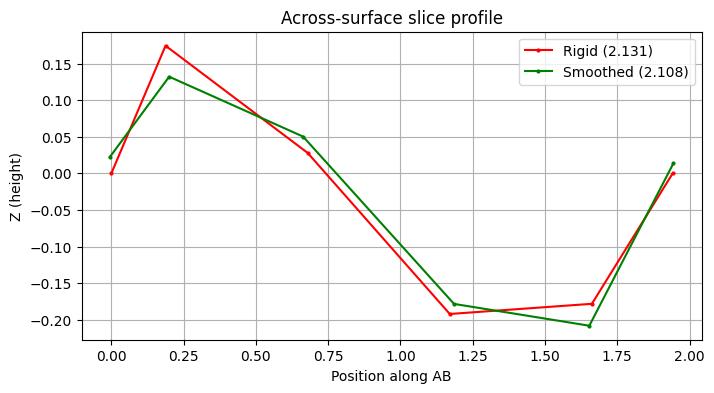

Geodesic distance: (np.float64(2.1307449139454167), np.float64(2.108018581322819))


In [68]:
import numpy as np
import open3d as o3d
import matplotlib.pyplot as plt
import scipy.interpolate as spi
from scipy.interpolate import splprep, splev

# ---------------------------------------------------------
# Test Script (use your own functions exactly as written)
# ---------------------------------------------------------

# 1. Create a synthetic "terrain" point cloud
def create_test_point_cloud():
    xs = np.linspace(0, 2, 80)
    ys = np.linspace(0, 2, 80)
    xs, ys = np.meshgrid(xs, ys)
    xs = xs.flatten()
    ys = ys.flatten()

    # wavy Z surface
    zs = 0.3 * np.sin(3 * xs) + 0.2 * np.cos(4 * ys)

    pts = np.vstack([xs, ys, zs]).T

    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(pts)
    return pcd


# 2. Pick two points A and B in 3D
A = np.array([0.2, 0.4, 0.0])
B = np.array([1.8, 1.5, 0.0])

# 3. Create the sample PCD
pcd = create_test_point_cloud()

# Wrap it to match your attribute names
class DummyPCD:
    def __init__(self, pcd):
        self.o3d_pcd = pcd

pcd_wrapper = DummyPCD(pcd)

# 4. Run your geodesic distance function
dist = get_geodesic_distance(pcd_wrapper, A, B, vis=True, smooth=True, smooth_factor=0.01)

print("Geodesic distance:", dist)

Plane equation: -0.5005554236740521x + -0.8657044922087965y + 0.0z + -5.488099679771064 = 0


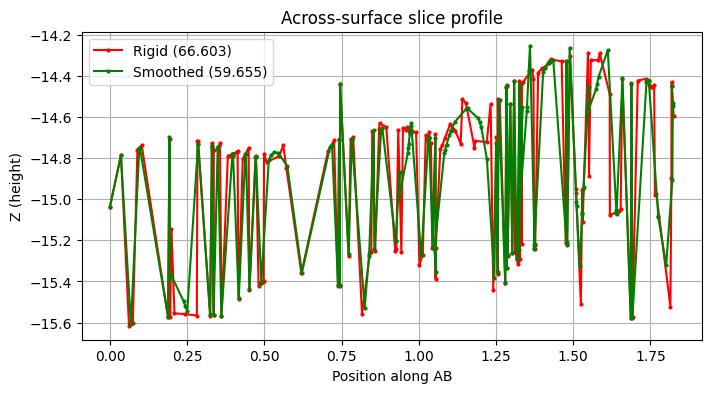

(np.float64(66.602898224207), np.float64(59.65532597715))

In [73]:
get_geodesic_distance(sna_23_pcd, anns_sna.coords[20], anns_sna.coords[21], vis=True, smooth=True, smooth_factor=1)

# Complexity Analysis

### Kalki

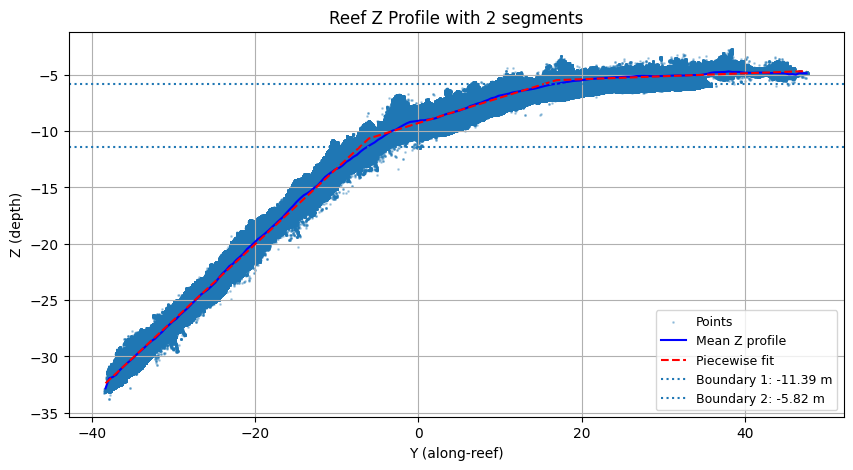

In [19]:
breaks = divide_reef_zones(kal_23_pcd, num_segments=2, vis=True)

In [67]:
avg_breaks = [-12.48, -6.09]
segments = get_pcd_segments_by_depth(kal_23_pcd, avg_breaks)
roughness_kalki = {}
for i, pcd in enumerate(segments):
    ra , rq ,_ = calc_roughness(pcd)
    visualizations.visualize_roughness(pcd, interactive=True, ra=ra, rq=rq)
    roughness_kalki[i] = (ra, rq)

print(roughness_kalki)

{0: (0.3691343546422329, 0.4623727103539079), 1: (0.5462033010286128, 0.7221003028728794), 2: (0.2066748959897651, 0.25869855765670285)}


In [68]:
mesh = o3d.io.read_triangle_mesh('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/meshes/cur_kal_2023_mesh.obj')
mesh.transform(kal_23_pcd.world_transform)
mesh_terrace = filter_mesh_by_z(mesh, z_min=avg_breaks[1], z_max=np.inf)
mesh_crest   = filter_mesh_by_z(mesh, z_min=avg_breaks[0], z_max= avg_breaks[1])
mesh_slope   = filter_mesh_by_z(mesh, z_min=-np.inf, z_max= avg_breaks[0])
meshes = [("terrace", mesh_terrace),
          ("crest", mesh_crest),
          ("slope", mesh_slope)]

for name, area_mesh in meshes:
    area_2D, mesh_2d = get_2D_footprint_area_PCA(area_mesh, vis=True)
    area_3D = get_3D_area(area_mesh)
    rugosity = get_3d_rugosity(area_2D, area_3D)
    print(f"{name}: 2D area = {area_2D}, 3D area = {area_3D}, rugosity = {rugosity}")

terrace: 2D area = 1712.1161383006868, 3D area = 2399.2941468144695, rugosity = 1.401361796166364
crest: 2D area = 2236.637559920769, 3D area = 3932.928331012305, rugosity = 1.7584111084817988
slope: 2D area = 3290.7638990917185, 3D area = 5875.301182839468, rugosity = 1.7853912839086106


Calculating fractal dimension for segment 0
Optimal box contains 3705782 out of 21593376 points
Box coordinates:  [[-3.872274652887926, -23.90981393666184], [21.127725347112076, -13.909813936661841]]


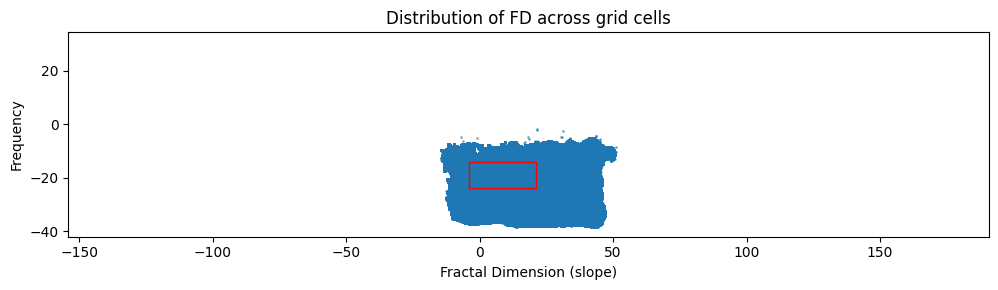

Mean Fractal Dimension: 2.14
Calculating fractal dimension for segment 1
Optimal box contains 3620067 out of 16812902 points
Box coordinates:  [[9.841522375200956, -6.737814303716863], [34.84152237520095, 3.2621856962831366]]


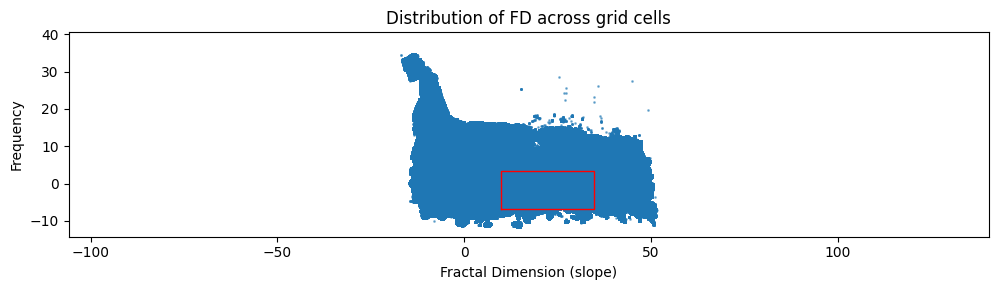

Mean Fractal Dimension: 2.10
Calculating fractal dimension for segment 2
Optimal box contains 2309712 out of 11441267 points
Box coordinates:  [[19.96756912524524, 14.634980971117606], [44.96756912524524, 24.634980971117606]]


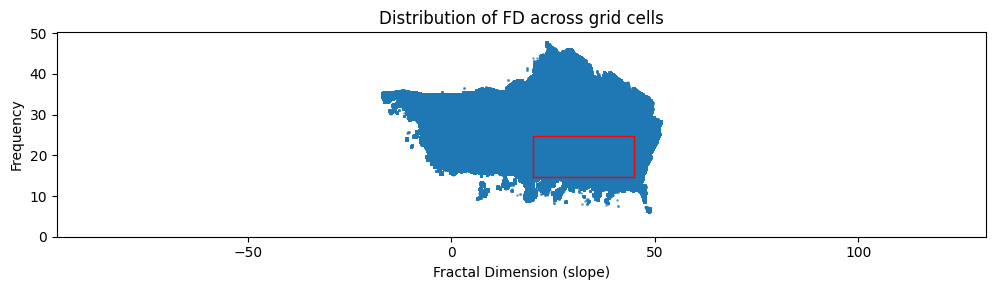

Mean Fractal Dimension: 2.03


In [69]:
region_dims = (25, 10)  # Example dimensions in meters (length, width)
box_size = 1  # Size of each grid cell in meters
kalki_FD = {}
for i, pcd in enumerate(segments):
    print(f"Calculating fractal dimension for segment {i}")
    FD = get_fractal_dimension_standardised(pcd, region_dims, box_size, iterations=5, plot=True)
    kalki_FD[i] = FD

In [85]:
def subdivide_mesh_xy(mesh, box_size=1.0, min_triangles=5, plot=False):
    """
    Subdivide a triangle mesh into XY-aligned blocks of given size.

    Parameters
    ----------
    mesh : o3d.geometry.TriangleMesh
        Input mesh.
    box_size : float
        Size of each block in XY (meters).
    min_triangles : int
        Minimum triangles per block to keep it.
    plot : bool
        Whether to show a quick visualization of block centroids.

    Returns
    -------
    block_meshes : list of o3d.geometry.TriangleMesh
        List of cropped block meshes.
    """
    vertices = np.asarray(mesh.vertices)
    triangles = np.asarray(mesh.triangles)
    
    # XY bounds of the mesh
    x_min, y_min = vertices[:,0].min(), vertices[:,1].min()
    x_max, y_max = vertices[:,0].max(), vertices[:,1].max()
    
    nx = int(np.ceil((x_max - x_min) / box_size))
    ny = int(np.ceil((y_max - y_min) / box_size))
    
    block_meshes = []
    
    for i in range(nx):
        for j in range(ny):
            x0, x1 = x_min + i*box_size, x_min + (i+1)*box_size
            y0, y1 = y_min + j*box_size, y_min + (j+1)*box_size
            
            # Keep triangles with any vertex inside block
            mask = np.any(
                (vertices[triangles] >= [x0, y0, -np.inf]) &
                (vertices[triangles] <  [x1, y1, np.inf]),
                axis=(1,2)
            )
            
            block_tris = triangles[mask]
            if len(block_tris) < min_triangles:
                continue  # skip empty/sparse blocks
            
            # Extract unique vertices for this block
            block_vertex_indices = np.unique(block_tris.flatten())
            block_vertices = vertices[block_vertex_indices]
            
            # Remap triangle indices
            mapping = {old: new for new, old in enumerate(block_vertex_indices)}
            block_tris_local = np.array([[mapping[idx] for idx in tri] for tri in block_tris])
            
            block_mesh = o3d.geometry.TriangleMesh()
            block_mesh.vertices = o3d.utility.Vector3dVector(block_vertices)
            block_mesh.triangles = o3d.utility.Vector3iVector(block_tris_local)
            block_mesh.compute_vertex_normals()
            
            block_meshes.append(block_mesh)
    
    if plot and block_meshes:
        # plot block centers
        centers = np.array([np.mean(np.asarray(b.vertices), axis=0) for b in block_meshes])
        import matplotlib.pyplot as plt
        plt.scatter(centers[:,0], centers[:,1], s=10)
        plt.xlabel("X")
        plt.ylabel("Y")
        plt.title("Block centroids")
        plt.show()
    
    return block_meshes

def get_fractal_dimension_surface_area(mesh, plot=False):
    resolutions = [0.01, 0.05, 0.15, 0.3, 0.6, 1.2]
    fractal_dimensions = []
    meshes = []
    
    mesh_blocks = subdivide_mesh_xy(mesh, box_size=1.0, min_triangles=5, plot=False)
    
    # Store areas per block
    all_areas = []

    for mesh_block in mesh_blocks:
        areas = []
        for δ in resolutions:
            mesh_decimated = mesh_block.simplify_vertex_clustering(
                voxel_size=δ,
                contraction=o3d.geometry.SimplificationContraction.Average
            )
            area = mesh_decimated.get_surface_area()
            areas.append(area)
            meshes.append(mesh_decimated)
        all_areas.append(areas)
        
        # FD per block
        log_delta = np.log(resolutions)
        log_area = np.log(areas)
        slope, intercept = np.polyfit(log_delta, log_area, 1)
        D = 2 - slope
        fractal_dimensions.append(D)
    
    FD = np.mean(fractal_dimensions)
    
    if plot and all_areas:
        import matplotlib.pyplot as plt
        import numpy as np
        
        # Compute mean log area across blocks
        all_areas = np.array(all_areas)  # shape: (n_blocks, n_resolutions)
        mean_log_area = np.log(all_areas).mean(axis=0)
        
        fig, ax = plt.subplots()
        ax.plot(np.log(resolutions), mean_log_area, "o-", label=f"Average FD ~ {FD:.2f}")
        ax.set_xlabel("log(δ)")
        ax.set_ylabel("log(Area)")
        ax.set_title("Average fractal dimension across blocks")
        ax.legend()
        return FD, meshes, fig
    else:
        return FD

In [84]:
o3d.visualization.draw_geometries([meshes[4]])

### Snakebay

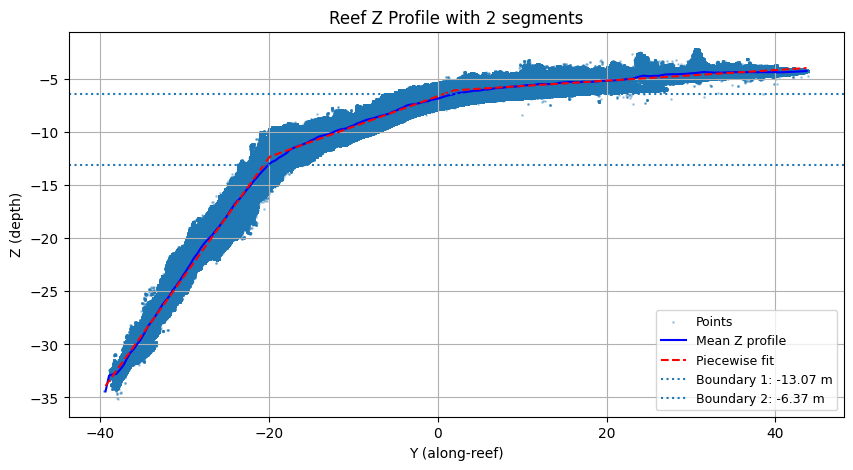

In [51]:
breaks = divide_reef_zones(sna_23_pcd, num_segments=2, vis=True)

In [ ]:
segments = get_pcd_segments_by_depth(sna_23_pcd, avg_breaks)
roughness_snakebay = {}
for i, pcd in enumerate(segments):
    ra , rq ,_ = calc_roughness(pcd)
    visualizations.visualize_roughness(pcd, interactive=True, ra=ra, rq=rq)
    roughness_snakebay[i] = (ra, rq)

print(roughness_snakebay)

Resorting to unclean kill browser.


{0: (0.40779623054946473, 0.5441478636432304), 1: (0.402421305335678, 0.5435300893701231), 2: (0.14052026629279396, 0.19796995020156188)}


In [ ]:
mesh = o3d.io.read_triangle_mesh('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/meshes/cur_sna_2023_mesh.obj')
mesh.transform(sna_23_pcd.world_transform)
mesh_terrace = filter_mesh_by_z(mesh, z_min=avg_breaks[1], z_max=np.inf)
mesh_crest   = filter_mesh_by_z(mesh, z_min=avg_breaks[0], z_max= avg_breaks[1])
mesh_slope   = filter_mesh_by_z(mesh, z_min=-np.inf, z_max= breaks[0])
meshes = [("terrace", mesh_terrace),
          ("crest", mesh_crest),
          ("slope", mesh_slope)]

for name, area_mesh in meshes:
    area_2D, mesh_2d = get_2D_footprint_area_PCA(area_mesh, vis=True)
    area_3D = get_3D_area(area_mesh)
    rugosity = get_3d_rugosity(area_2D, area_3D)
    print(f"{name}: 2D area = {area_2D}, 3D area = {area_3D}, rugosity = {rugosity}")

terrace: 2D area = 2150.5570090037118, 3D area = 2757.293273388457, rugosity = 1.2821298211786665
crest: 2D area = 2002.024167185194, 3D area = 2961.740895911219, rugosity = 1.4793731986139644
slope: 2D area = 2577.372650627938, 3D area = 4388.32876331487, rugosity = 1.7026365055304362


Calculating fractal dimension for segment 0
Optimal box contains 7148594 out of 17556562 points
Box coordinates:  [[11.714853574768707, -29.361699154921183], [36.71485357476871, -19.361699154921183]]


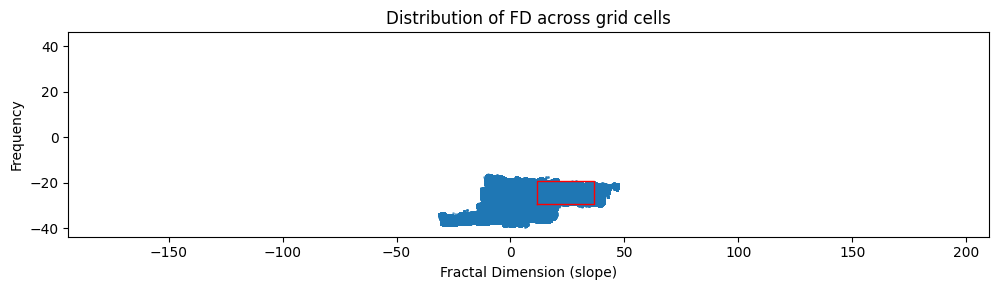

Mean Fractal Dimension: 2.14
Calculating fractal dimension for segment 1
Optimal box contains 3931044 out of 16221848 points
Box coordinates:  [[18.37229181563618, -21.364737137673146], [43.37229181563618, -11.364737137673146]]


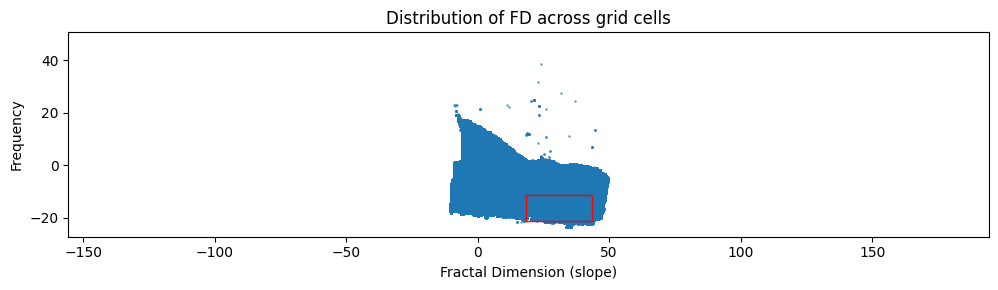

Mean Fractal Dimension: 2.09
Calculating fractal dimension for segment 2
Optimal box contains 2225650 out of 14551220 points
Box coordinates:  [[28.43576177527041, 17.878668904742707], [53.43576177527041, 27.878668904742707]]


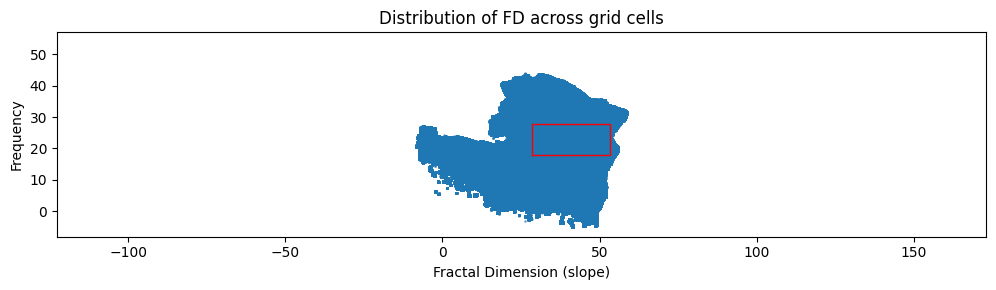

Mean Fractal Dimension: 2.01


In [59]:
region_dims = (25, 10)  # Example dimensions in meters (length, width)
box_size = 1  # Size of each grid cell in meters
snakebay_FD = {}
for i, pcd in enumerate(segments):
    print(f"Calculating fractal dimension for segment {i}")
    FD = get_fractal_dimension_standardised(pcd, region_dims, box_size, iterations=5, plot=True)
    snakebay_FD[i] = FD

# Sea Aquarium

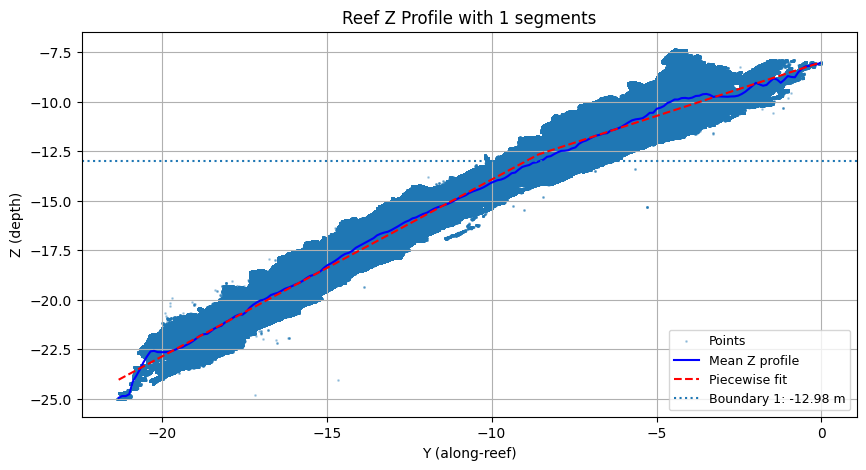

In [60]:
breaks = divide_reef_zones(sea_21_pcd, num_segments=1, vis=True)

In [ ]:
segments = get_pcd_segments_by_depth(sea_21_pcd, avg_breaks)
roughness_seaquarium = {}
for i, pcd in enumerate(segments):
    ra , rq ,_ = calc_roughness(pcd)
    visualizations.visualize_roughness(pcd, interactive=True, ra=ra, rq=rq)
    roughness_snakebay[i] = (ra, rq)

print(roughness_seaquarium)

{}


In [ ]:
mesh = o3d.io.read_triangle_mesh('/Users/dvan216/Documents/Inkfish-Phd/MADR_CH1/Models/meshes/cur_sea_2021_mesh.obj')
mesh.transform(sea_21_pcd.world_transform)
mesh_crest = filter_mesh_by_z(mesh, z_min=avg_breaks[0], z_max=np.inf)
mesh_slope   = filter_mesh_by_z(mesh, z_min=-np.inf, z_max= avg_breaks[0])
meshes = [("crest", mesh_crest),
          ("slope", mesh_slope)]

for name, area_mesh in meshes:
    area_2D, mesh_2d = get_2D_footprint_area_PCA(area_mesh, vis=True)
    area_3D = get_3D_area(area_mesh)
    rugosity = get_3d_rugosity(area_2D, area_3D)
    print(f"{name}: 2D area = {area_2D}, 3D area = {area_3D}, rugosity = {rugosity}")

terrace: 2D area = 2150.5570090037118, 3D area = 2757.293273388457, rugosity = 1.2821298211786665
crest: 2D area = 358.7298668944937, 3D area = 642.6381634138546, rugosity = 1.7914264261772812
slope: 2D area = 656.7128852124505, 3D area = 1128.5145873436013, rugosity = 1.7184291838259276


Calculating fractal dimension for segment 0
Optimal box contains 25712004 out of 32981783 points
Box coordinates:  [[6.739966278659627, -18.963944521920922], [31.739966278659626, -8.963944521920922]]


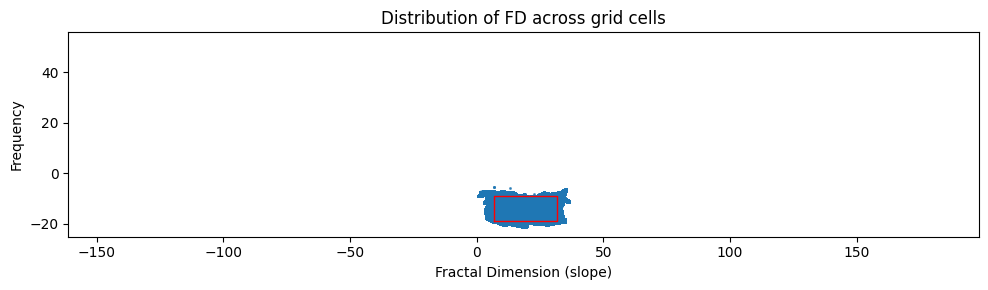

Mean Fractal Dimension: 2.06
Calculating fractal dimension for segment 1
Optimal box contains 13871254 out of 17018217 points
Box coordinates:  [[7.7, -10.203321266560883], [32.7, -0.20332126656088256]]


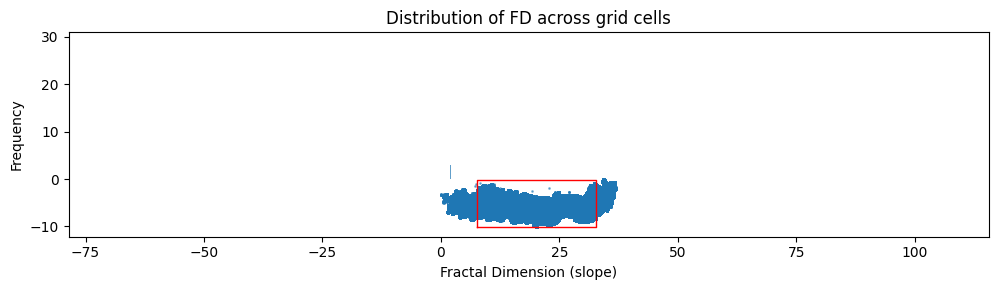

Mean Fractal Dimension: 2.04


In [64]:
region_dims = (25, 10)  # Example dimensions in meters (length, width)
box_size = 1  # Size of each grid cell in meters
snakebay_FD = {}
for i, pcd in enumerate(segments):
    print(f"Calculating fractal dimension for segment {i}")
    FD = get_fractal_dimension_standardised(pcd, region_dims, box_size, iterations=5, plot=True)
    snakebay_FD[i] = FD

# Monostand diversity analysis

In [ ]:
#check to see if samples are in a monostand
import numpy as np
import open3d as o3d

samples = np.loadtxt("samples.csv", delimiter=",", skiprows=1, usecols=(1,2,3))
sample_ids = np.loadtxt("samples.csv", delimiter=",", skiprows=1, usecols=(0,), dtype=str)

# Example polygon file format:
# cluster_id,x1,y1,z1,x2,y2,z2,x3,y3,z3,...
# You can easily export these from your Metashape/analysis environment.

clusters = []
with open("clusters.txt") as f:
    for line in f:
        vals = line.strip().split(",")
        cid = int(vals[0])
        coords = np.array(list(map(float, vals[1:])))
        poly = coords.reshape(-1, 3)
        clusters.append((cid, poly))

# ============================================================
# STEP 3 (optional): Apply transformation matrix
# ============================================================
# If you have a 4x4 world transform matrix from Metashape:
# matrix = np.loadtxt("world_transform.txt")
# def apply_transform(points, M):
#     pts_h = np.c_[points, np.ones(points.shape[0])]
#     pts_t = (M @ pts_h.T).T
#     return pts_t[:, :3]
# samples = apply_transform(samples, matrix)
# clusters = [(cid, apply_transform(poly, matrix)) for cid, poly in clusters]

# ============================================================
# STEP 4: Point-in-polygon test (2D version)
# ============================================================

def point_in_polygon_2d(point, polygon):
    """Ray-casting algorithm to test if a point (x, y) lies inside a polygon."""
    x, y = point[:2]
    poly = polygon[:, :2]
    inside = False
    n = len(poly)
    p1x, p1y = poly[0]
    for i in range(n + 1):
        p2x, p2y = poly[i % n]
        if min(p1y, p2y) < y <= max(p1y, p2y) and x <= max(p1x, p2x):
            if p1y != p2y:
                xinters = (y - p1y) * (p2x - p1x) / (p2y - p1y) + p1x
            if p1x == p2x or x <= xinters:
                inside = not inside
        p1x, p1y = p2x, p2y
    return inside

# ============================================================
# STEP 5: Assign each sample to cluster
# ============================================================

results = []
for sid, spt in zip(sample_ids, samples):
    cluster_found = None
    for cid, poly in clusters:
        if point_in_polygon_2d(spt, poly):
            cluster_found = cid
            break
    results.append((sid, *spt, cluster_found if cluster_found else 0))

# ============================================================
# STEP 6: Save results
# ============================================================

with open("samples_with_clusters.csv", "w") as f:
    f.write("sample_id,x,y,z,cluster_id\n")
    for r in results:
        f.write(f"{r[0]},{r[1]:.3f},{r[2]:.3f},{r[3]:.3f},{r[4]}\n")

print("✅ Done — results saved to samples_with_clusters.csv")